In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import anndata as ad
import matplotlib.pyplot as plot
import seaborn as sns
from collections import Counter
from sklearn import metrics
from sklearn.metrics import pairwise_distances
from numba import jit
from scipy import spatial
from IPython import get_ipython
get_ipython().run_line_magic('matplotlib', 'inline')


... storing 'Plate' as categorical
... storing 'Sample' as categorical
... storing 'Stage' as categorical
... storing 'cluster_id' as categorical


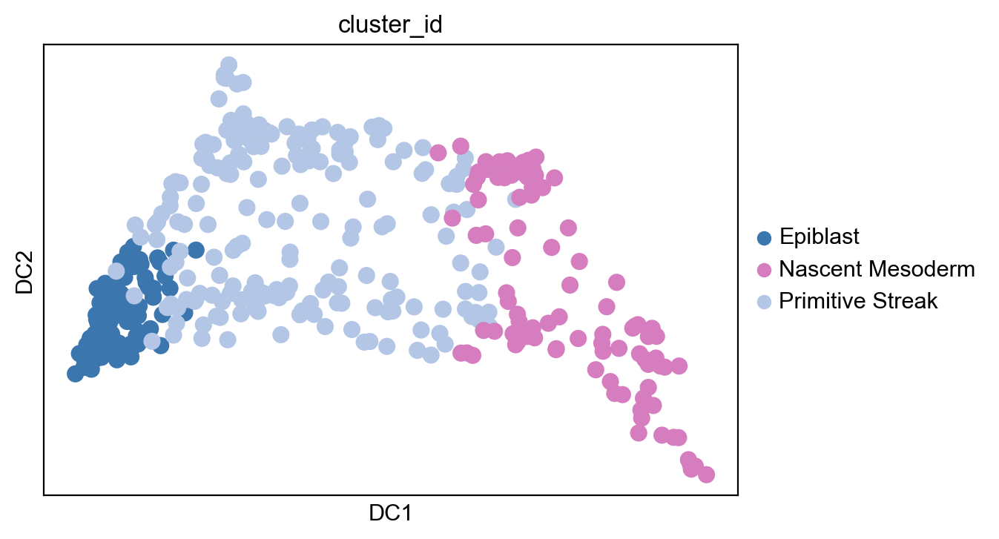

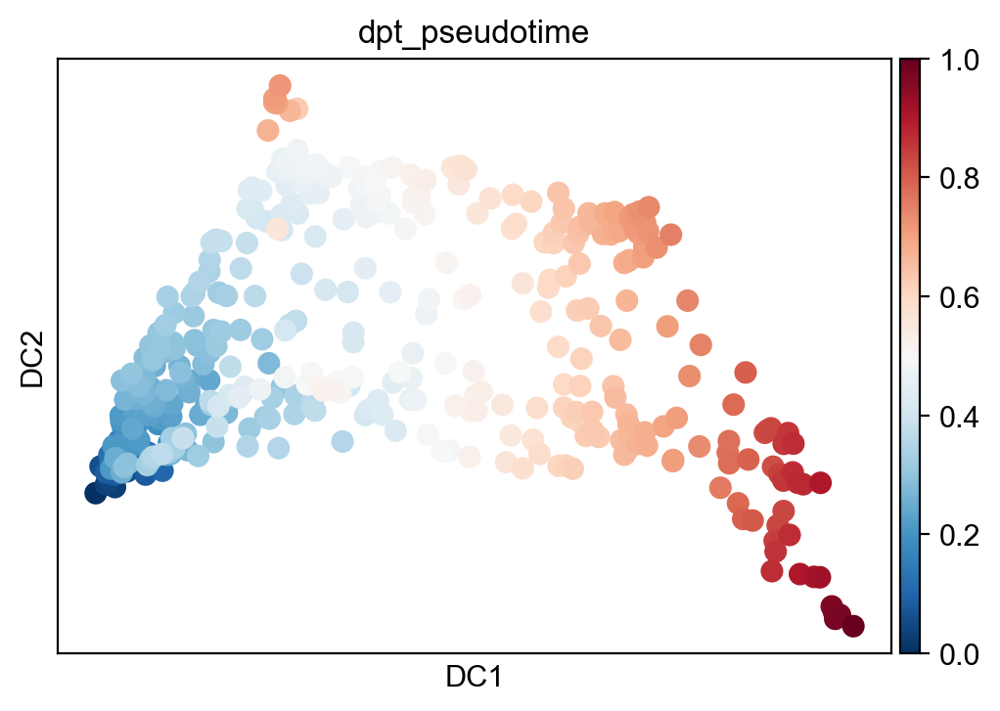

,Unnamed: 0,Cell#,Plate,Run lane,Sample,Stage,batch,cluster_id,fraction mapped,fraction mito,fraction spike-in,gene count,leiden,total reads (log10),dpt_pseudotime
0,SS.sc7786076-1-0,1,SCGC--3859,SS.sc7786076,Group2,CS6,0,Epiblast,0.783150,0.009826,0.050600,5716,4,5.612175,0.257873
1,SS.sc7786040-1-0,1,SCGC--3861,SS.sc7786040,Group2,CS6,0,Epiblast,0.664391,0.008773,0.035739,5873,4,5.572693,0.215336
2,SS.sc7786487-1-0,1,SCGC--2860,SS.sc7786487,Group1,CS6,0,Epiblast,0.752692,0.005969,0.031154,6564,4,5.676068,0.212839
3,SS.sc7786618-1-0,1,SCGC--2860,SS.sc7786618,Group1,CS6,0,Epiblast,0.772056,0.007628,0.021395,7472,4,5.682113,0.021644
4,SS.sc7786718-1-0,1,SCGC--2860,SS.sc7786718,Group1,CS6,0,Epiblast,0.795020,0.006813,0.017909,7826,4,5.613692,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
428,SS.sc7785824-1-2,1,SCGC--3861,SS.sc7785824,Group2,CS6,2,Nascent Mesoderm,0.682360,0.004509,0.036099,5417,6,5.707276,0.869802
429,SS.sc7786180-1-2,1,SCGC--3859,SS.sc7786180,Group2,CS6,2,Nascent Mesoderm,0.750193,0.006945,0.056165,4612,6,5.824669,0.782834
430,SS.sc7785690-1-2,1,SCGC--3861,SS.sc7785690,Group2,CS6,2,Nascent Mesoderm,0.656944,0.005292,0.048223,5128,6,5.765372,0.827372
431,SS.sc7785702-1-2,1,SCGC--3861,SS.sc7785702,Group2,CS6,2,Nascent Mesoderm,0.568882,0.005438,0.089861,2906,6,5.906972,0.711926


In [96]:
from IPython import get_ipython
get_ipython().run_line_magic('matplotlib', 'inline')

cm = ad.read_csv('Data/epi_meso.csv')  #load the normalized data
anno  = pd.read_csv('Data/epi_meso_anno.csv')
cm.obs=anno
sc.pp.filter_genes(cm, min_cells=10)

sc.pp.highly_variable_genes(cm, max_mean=10,n_top_genes=1000)
cm = cm[:, cm.var['highly_variable']]
cm = sc.tl.pca(cm,svd_solver = 'arpack', n_comps = 50,copy=True)

sc.pp.neighbors(cm,n_pcs=15,n_neighbors=15, method = 'umap')

sc.tl.diffmap(cm)

import scvelo as scv
scv.settings.set_figure_params('scvelo',vector_friendly=False,format='pdf')

sc.pl.diffmap(cm,color='cluster_id',palette=['#3C76AF','#D57DBF','#B3C6E5'])
a= list(cm.obsm['X_diffmap'][:,1])
root = a.index(min(a))

cm.uns['iroot']=root
sc.tl.dpt(cm,n_dcs=10)
#cm.obs['dpt_pseudotime'] = 1-cm.obs['dpt_pseudotime']
pseudoh=list(cm.obs['dpt_pseudotime'])

sc.pl.diffmap(cm,color='dpt_pseudotime',save='Fig3d_human_dpt.pdf')
cm.obs

In [ ]:
import scvelo as scv
scv.settings.set_figure_params('scvelo')
adata =  scv.read('onefilepercell_SS-sc7785278_and_others_Q4SJ9.loom', cache=True)
scv.utils.show_proportions(adata)
scv.utils.cleanup(adata, clean='all')
onam = []
for o in list(adata.obs.index):
    a=o[45:].replace('-','.')
    onam.append(a[:12])
adata.obs_names = onam
#high_var2.obs_names = list(cm.obs['Run lane'])
#kdata =  high_var2[onam,:]
cm.obs_names  = list(cm.obs['Run lane'])
inter = list(set(list(cm.obs_names)).intersection(set(list(adata.obs_names))))
adata = adata[inter,:]
cm = cm[inter,:]

adata.obsm['X_umap'] = cm.obsm['X_diffmap'][:,1:4]
adata.obs['clusters'] = list(cm.obs['cluster_id'])
scv.utils.cleanup(adata, clean='all')
scv.pp.filter_and_normalize(adata, min_counts=10, min_counts_u=10, n_top_genes=2500)
scv.pp.moments(adata, n_pcs=15, n_neighbors=30)
#scv.tl.recover_dynamics(adata)
scv.tl.velocity(adata, mode='stochastic')
#scv.tl.velocity_graph(adata)
scv.tl.velocity_graph(adata)
#scv.tl.velocity_clusters(adata,resolution=0.2)
adata.uns['clusters_colors']=cm.uns['cluster_id_colors']
scv.settings.set_figure_params('scvelo',vector_friendly=False,format='pdf')

scv.pl.velocity_embedding_stream(adata, basis='umap',projection='2d',components='1,2',legend_loc='right margin',dpi=150, 
                          color="clusters",save='rnavelo_epi.pdf',frameon=True)


In [ ]:
scv.settings.set_figure_params('scvelo',vector_friendly=False,format='svg')

scv.pl.velocity_embedding_stream(adata, basis='umap',projection='2d',components='1,2',
                              xlim=[-0.08,0.12],   legend_loc='right margin',dpi=150, ylim=[-0.14,0.14], color="clusters",save='rnavelo_epi.svg')
#np.min(cm.obsm['X_diffmap'][:,1])

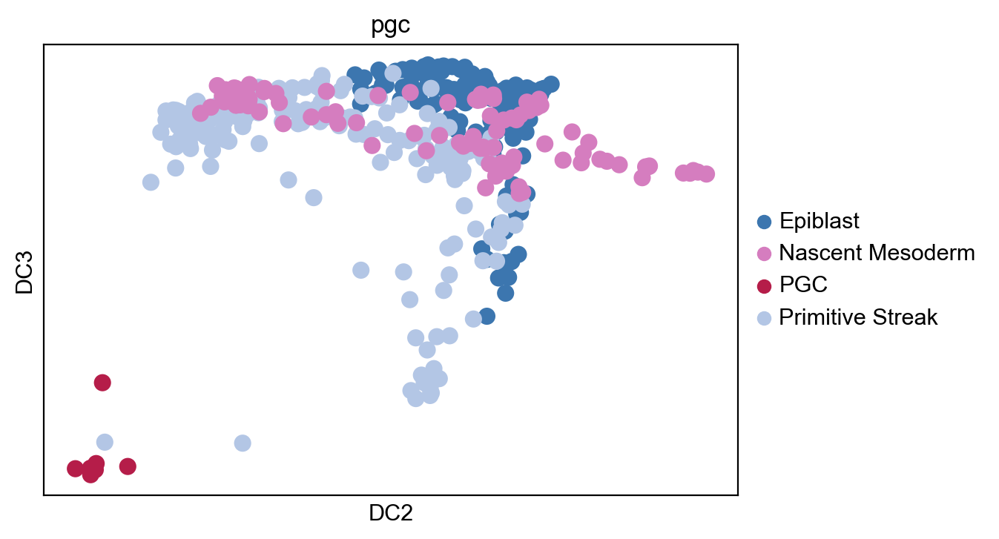

In [136]:
#log_data2 = ad.read_csv("script_heart+gastr/norm_true_data.csv")#load the normalized data
#log_data2= sc.pp.log1p(log_data2,copy = True)
#log_data2.obs = pd.read_csv('ori_gast_umap.csv')
#pgc=[]
#for o in cm.obs['Run lane']:
#    pgc.append(log_data2[log_data2.obs['cell_name']==o].obs['sub_cluster'].values[0])
    
#cm.obs['pgc']=pgc
sc.pl.diffmap(cm,color='pgc',palette= ['#3C76AF','#D57DBF',"#b51d49",'#B3C6E5'],components='2,3',save='pgc_diffmap2_3.pdf')

In [291]:
cme = ad.read_csv('Data/epi_meso.csv')  #load the normalized data
anno  = pd.read_csv('Data/epi_meso_anno.csv')
#cm = sc.pp.scale(cm,max_value=1,zero_center=True,copy=True)

cm_df = cme[: ,['CDH1', 'TBXT', 'SNAI1', 'SNAI2','MSGN1', 'TDGF1', 'FGF8', 'FGF2']].to_df()


In [98]:
%get cm_df
%get pseudoh

library(gam, quietly = TRUE, warn.conflicts = FALSE)
library(scran, quietly = TRUE, warn.conflicts = FALSE)

#Extract the diffusion pseudotime from Python and use it as the independent variable in a 
# Generalized Additive Model (GAM) fit 
data<-cm_df
data<-t(data)

#Create an sce object and add the diffusion pseudotime (it's a vector obtained from scanpy 
#or destiny)
sce<-SingleCellExperiment(assays = list(counts = as.matrix(data)))
sce$Pseudotime <- pseudoh

#Y is the (log-norm) count matrix for the genes expressed in at least 10 cells
Y <- counts(sce)
t <- sce$Pseudotime

#Uncomment the following lines if you want to run GAM only for one gene
#vec <- c("Spink1")
#idx<-match(vec, rownames(Y))
#d <- data.frame(z=Y[idx,], t=t)
#tmp <- gam(z ~ lo(t), data=d)
#print(summary(tmp))
#print(fitted(tmp))

#Run GAM with LOESS function for all the genes: save the p-value of parametric ANOVA 
#and the fitted expression values for each genes
gam.res <- apply(Y, 1, function(z){
    d <- data.frame(z=z, t=t)
    tmp <- gam(z ~ lo(t), data=d)
    p <- summary(tmp)[4][[1]][1,5]  #p-value parametric ANOVA
    f<-fitted(tmp)
    ss<-predict.Gam(tmp,se.fit=TRUE)
    s<-data.frame(ss)[seq_len(ncol(data.frame(ss))) %% 3 == 2]
    f
    #p2 <- summary(tmp)[3][[1]][2,3]  #p-value non-parametric ANOVA
    
    #c(p1,p2)   #If we want to return both the parametric and non-parametric p-values
})
gam.rese <- apply(Y, 1, function(z){
    d <- data.frame(z=z, t=t)
    tmp <- gam(z ~ lo(t), data=d)
    p <- summary(tmp)[4][[1]][1,5]  #p-value parametric ANOVA
    f<-fitted(tmp)
    ss<-predict.Gam(tmp,se.fit=TRUE)
    #s<-data.frame(ss)[seq_len(ncol(data.frame(ss))) %% 3 == 2]
    ss
    #p2 <- summary(tmp)[3][[1]][2,3]  #p-value non-parametric ANOVA
    
    #c(p1,p2)   #If we want to return both the parametric and non-parametric p-values
})
gam.rese<-data.frame(gam.rese)[seq_len(ncol(data.frame(gam.rese))) %% 3 == 2]
#gam.res<-cbind(gam.res,pseudoh)
#gam.res<-data.frame(gam.res)

In [99]:
#gam.fitted<-gam.res[-1,]
gam.fitted<-cbind(gam.fitted, pseudoh)
gam.fitted<-write.csv(gam.res,'Fig2c_h.csv',sep=',')

Warning message in write.csv(gam.res, "Fig2c_h.csv", sep = ","):
“attempt to set 'sep' ignored”

In [538]:
#Build the table of the genes p-values
genes.table<-data.frame(genes.names=rownames(data))
genes.table$pvals<-gam.res[1,]
genes.table$FDR<-p.adjust(genes.table$pvals, method="fdr") #Adjust p-values
genes.table<-genes.table[order(genes.table$FDR),] #Order the genes according to the FDR
genes.table$genes.names <- as.character(genes.table$genes.names)
genes.table
#Note that we are using a very strict threshold on FDR! Otherwise we obtain a very large number
#of genes
results.gam.tot<-genes.table[genes.table$FDR < 0.01,][c('genes.names','FDR')] #Filter the significant genes
results.gam.tot<-na.omit(results.gam.tot)
#Save the matrix of fitted values
gam.fitted<-gam.res[-1,]
genes.table<-na.omit(genes.table)
print(paste("We have"
           ,sum(genes.table$FDR < 0.01)
           ,"significant genes"))



,genes.names,pvals,FDR
2,T,0.000000e+00,0.000000e+00
3,Snai1,0.000000e+00,0.000000e+00
5,Tdgf1,0.000000e+00,0.000000e+00
6,Fgf8,0.000000e+00,0.000000e+00
1,Cdh1,1.502002e-148,2.102803e-148
4,Snai2,1.880300e-02,2.193684e-02
7,Fgf2,5.384282e-01,5.384282e-01


In [2]:
#write.table(gam.fitted,'Data/gamfit_human.csv',sep=',')
require(ggplot2)

Loading required package: ggplot2



In [ ]:
results_gam_tot = pd.read_csv('Data/gamgenes_human.csv',sep=',')
gam_fitted = ad.read_csv('Data/gamfit_human.csv',delimiter=',')
#Names of the significant genes
results_gam_h=list(results_gam_tot['genes.names'])
gam_fitted=ad.AnnData(gam_fitted)
gam_fitted.obs=cm.obs
#gam_fitted.var_names=cm.var_names
gam_fitted=gam_fitted[:,results_gam_h]


['GSE1']

In [83]:
cm = ad.read_csv('Data/epi_meso.csv')  #load the normalized data

DE_genes_df = cm[:,results_gam_h]
DE_genes_df = DE_genes_df.to_df()



---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
script_3493660838386892885 in <module>
      cm = ad.read_csv('Data/epi_meso.csv')  #load the normalized data
      
----> DE_genes_df = cm[:,results_gam_h]
      DE_genes_df = DE_genes_df.to_df()

NameError: name 'results_gam_h' is not defined


In [ ]:
%get DE_genes_df

#Robustness analysis: change the number X of the high_varX_df to compute the robustness curve for a cluster

library(dynamicTreeCut, quietly = TRUE, warn.conflicts = FALSE)
#library(WGCNA, quietly = TRUE, warn.conflicts = FALSE)
library(Rtsne, quietly = TRUE, warn.conflicts = FALSE)
library(mcclust, quietly = TRUE, warn.conflicts = FALSE)

finalClus <- function(df,deepSplit){
    data<-as.matrix(df)
    cor.mat<-cor(data,method="spearman")
    dissim<-sqrt((1-cor.mat)/2)
    dist.mat<-as.dist(dissim)
    test.clust<-hclust(dist.mat, method="average")
    clust<-cutreeDynamic(test.clust,distM=as.matrix(dist.mat), minClusterSize=100,
                         method="hybrid", deepSplit =deepSplit)
    clust
}

#Perform the actual clustering after choosing deepSplit from the robustness curve
clust<-finalClus(DE_genes_df,0)
print(max(clust))

In [ ]:
%get clust --from R
norm_data_DE_genes=cm[:,results_gam_h]
norm_data_DE_genes.var['cl_labels']=list(clust)
norm_data_DE_genes.var['cl_labels'].value_counts()
results_gam_tot['cl_labels']=list(clust)
df=pd.DataFrame({'1-names':list(results_gam_tot[results_gam_tot['cl_labels']==1]['genes.names']),
                '1-FDR':list(results_gam_tot[results_gam_tot['cl_labels']==1]['FDR'])})

for i in range(np.amax(clust)):
    i=i+1
    if i!=1:
        df1=pd.DataFrame({str(i)+'-names':list(results_gam_tot[results_gam_tot['cl_labels']==i]['genes.names']),
                         str(i)+'-FDR':list(results_gam_tot[results_gam_tot['cl_labels']==i]['FDR'])})
        df=pd.concat([df,df1], ignore_index=True, axis=1)
gam_fitted=gam_fitted.copy()
DE_genes_df=gam_fitted.T.to_df()

#Normalize expression of genes between 0 and 1
DE_genes_df_max = DE_genes_df.max(axis=1)
DE_genes_df=DE_genes_df.divide(DE_genes_df_max, axis=0)

#Add labels of the cluster for each gene
DE_genes_df['cl_lab']=list(clust)

#For each cluster compute the mean expression of the genes in each cell
mean_df=DE_genes_df.groupby('cl_lab').mean()
std_df=DE_genes_df.groupby('cl_lab').std()
cm.obs['dpt_pseudotime']=pseudoh
mean_df=mean_df.append([cm.obs['dpt_pseudotime']])
std_df=std_df.append(cm.obs['dpt_pseudotime'])

new_columns = mean_df.columns[mean_df.loc[mean_df.last_valid_index()].argsort()]
mean_df=mean_df[new_columns]
std_df=std_df[new_columns]
mean_df=np.array(mean_df)
std_df=np.array(std_df)



In [ ]:
import matplotlib.pyplot as plot
import pylab

for i in range(np.amax(clust)):
    pylab.ylim(-0.1,1.1)
    plot.title('Cluster %s' % str(i+1))
    plot.xlabel('diffusion pseudotime')
    plot.ylabel('mean expression')
    plot.plot(mean_df[-1],mean_df[i])
    #plot.plot(mean_df[4],mean_df[i]+std_df[i])
    #plot.plot(mean_df[4],mean_df[i]-std_df[i])
    
    plot.fill_between(mean_df[-1], 
                      mean_df[i]-std_df[i], mean_df[i]+std_df[i],
                      alpha=0.5, edgecolor='C0', facecolor='C0')
    
    plot.show(),plot.close()

In [ ]:
#norm_data_DE_genes[:,norm_data_DE_genes.var['cl_labels']==2].var_names
h_clust = norm_data_DE_genes.var
h_clust['FDR']= list(results_gam_tot['FDR'])

In [2]:
mouse = sc.read_10x_mtx('atlas/')
meta = pd.read_csv('atlas/meta.tab', sep='\t')
mouse.obs = meta


/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/sos/step_executor.py:1058: DtypeWarning: Columns (27) have mixed types.Specify dtype option on import or set low_memory=False.
  self.execute(statement[1])


In [3]:
m75 = mouse[mouse.obs['stage']=='E7.25'].copy()
m_epi = m75[m75.obs['celltype']=='Epiblast']
m_ps = m75[m75.obs['celltype']=='Primitive Streak']
m_mes = m75[m75.obs['celltype']=='Nascent mesoderm']
m_ecto = m75[m75.obs['celltype']=='Surface ectoderm']
m_ps[:,'Cdh1'].X.toarray()

/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


array([[0.],
       [1.],
       [4.],
       ...,
       [0.],
       [0.],
       [0.]], dtype=float32)

... storing 'barcode' as categorical
... storing 'stage' as categorical
... storing 'theiler' as categorical
... storing 'celltype' as categorical
... storing 'colour' as categorical
... storing 'haem_subclust' as categorical
... storing 'endo_trajectoryName' as categorical
... storing 'endo_gutCluster' as categorical


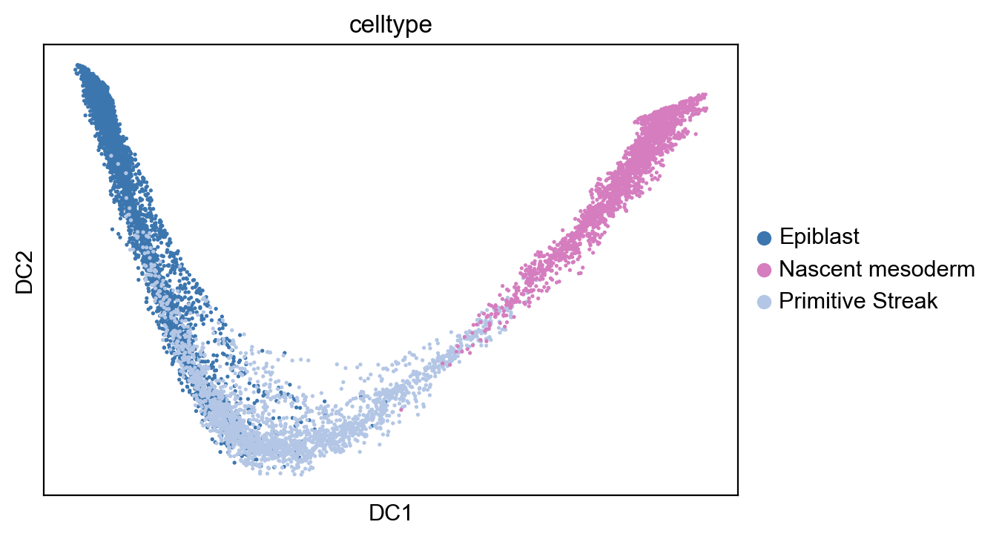

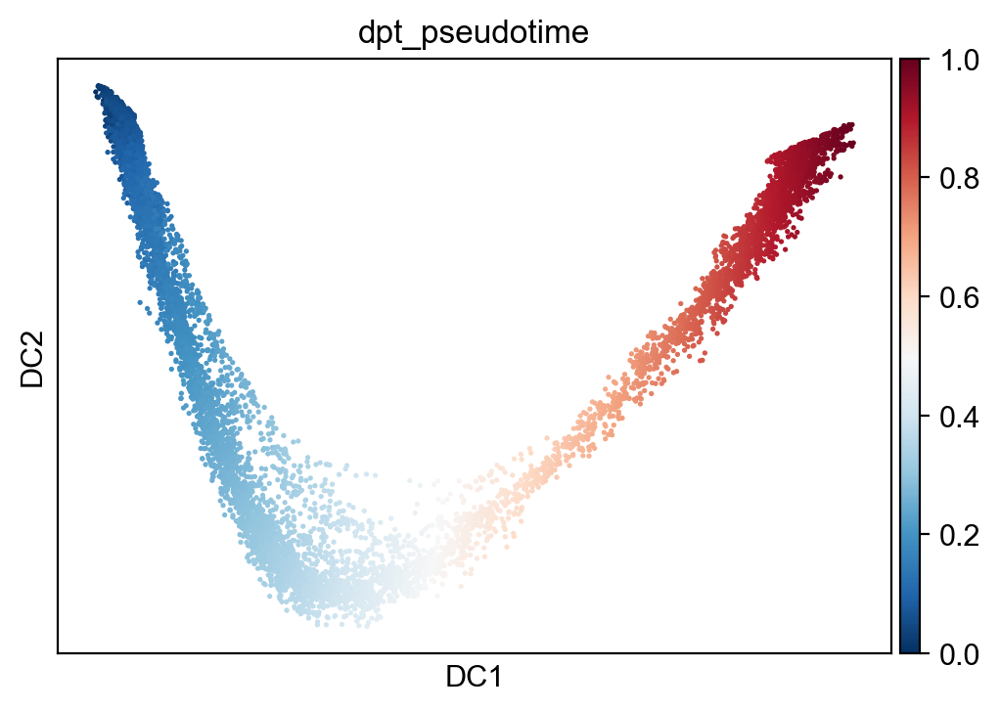

In [95]:
#mu = ad.read_csv('Data/epi_meso_m.csv')
mu = m_epi.concatenate(m_ps,m_mes)
#mu.obs.to_csv('Data/epi_meso_anno_m.csv')

#mu.obs = pd.read_csv('Data/epi_meso_anno_m.csv')
sc.pp.normalize_total(mu)
sc.pp.filter_genes(mu, min_cells=20)
sc.pp.log1p(mu)
sc.pp.highly_variable_genes(mu, max_mean=10,n_top_genes=200)
muc = mu[:, mu.var['highly_variable']]
muc = sc.tl.pca(muc,svd_solver = 'arpack', n_comps = 50,copy=True)

sc.pp.neighbors(muc,n_pcs=4,n_neighbors=15, method = 'umap')

sc.tl.diffmap(muc)
#sc.pl.diffmap(muc,color='celltype')
a= list(muc.obsm['X_diffmap'][:,1])
root = a.index(min(a))

muc.uns['iroot']=root
sc.tl.dpt(muc,n_dcs=10)
sc.pl.diffmap(muc,color='celltype',palette=['#3C76AF','#D57DBF','#B3C6E5'],save='Fig3d_mouse.pdf')
sc.pl.diffmap(muc,color='dpt_pseudotime',save='Fig3d_mouse_dpt.pdf')

cm_df =mu.to_df()
pseudom=list(muc.obs['dpt_pseudotime'])

In [246]:
mu = ad.read_csv('Data/epi_meso_m.csv')

mu.obs = pd.read_csv('Data/epi_meso_anno_m.csv')

sc.pp.normalize_total(mu)
sc.pp.filter_genes(mu, min_cells=20)
sc.pp.log1p(mu)
sc.pp.highly_variable_genes(mu, max_mean=10,n_top_genes=500)
muc = mu[:, mu.var['highly_variable']]
muc = sc.tl.pca(muc,svd_solver = 'arpack', n_comps = 50,copy=True)

sc.pp.neighbors(muc,n_pcs=5,n_neighbors=15, method = 'umap')

sc.tl.diffmap(muc)
#sc.pl.diffmap(muc,color='celltype')
a= list(muc.obsm['X_diffmap'][:,1])
root = a.index(min(a))

muc.uns['iroot']=root
sc.tl.dpt(muc,n_dcs=10)
sc.pl.diffmap(muc,color=['celltype','dpt_pseudotime'])


---------------------------------------------------------------------------
ValueError                                Traceback (most recent call last)
script_3517268122779382755 in <module>
      mu = ad.read_csv('Data/epi_meso_m.csv')
      
----> mu.obs = pd.read_csv('Data/epi_meso_anno_m.csv')
      
      sc.pp.normalize_total(mu)
      sc.pp.filter_genes(mu, min_cells=20)

ValueError: Length of passed value for obs_names is 9613, but this AnnData has shape: (8328, 29452)


In [100]:
mu = m_epi.concatenate(m_ps,m_mes)
#sc.pp.filter_genes(mu, min_cells=20)
#sc.pp.normalize_total(muc)

sc.pp.log1p(mu)
mu =mu[:,['Cdh1', 'T', 'Snai1', 'Snai2','Msgn1', 'Tdgf1', 'Fgf8', 'Fgf2']]
cm_df =mu.to_df()
pseudomn=list(muc.obs['dpt_pseudotime'])

In [101]:
%get cm_df
%get pseudomn

library(gam, quietly = TRUE, warn.conflicts = FALSE)
library(scran, quietly = TRUE, warn.conflicts = FALSE)

#Extract the diffusion pseudotime from Python and use it as the independent variable in a 
# Generalized Additive Model (GAM) fit 
data<-cm_df
data<-t(data)

#Create an sce object and add the diffusion pseudotime (it's a vector obtained from scanpy 
#or destiny)
sce<-SingleCellExperiment(assays = list(counts = as.matrix(data)))
sce$Pseudotime <- pseudomn

#Y is the (log-norm) count matrix for the genes expressed in at least 10 cells
Y <- counts(sce)
t <- sce$Pseudotime

#Uncomment the following lines if you want to run GAM only for one gene
#vec <- c("Spink1")
#idx<-match(vec, rownames(Y))
#d <- data.frame(z=Y[idx,], t=t)
#tmp <- gam(z ~ lo(t), data=d)
#print(summary(tmp))
#print(fitted(tmp))

#Run GAM with LOESS function for all the genes: save the p-value of parametric ANOVA 
#and the fitted expression values for each genes
gam.res <- apply(Y, 1, function(z){
    d <- data.frame(z=z, t=t)
    tmp <- gam(z ~ lo(t), data=d)
    p <- summary(tmp)[4][[1]][1,5]  #p-value parametric ANOVA
    f<-fitted(tmp)
    ss<-predict.Gam(tmp,se.fit=TRUE)
    s<-data.frame(ss)[seq_len(ncol(data.frame(ss))) %% 3 == 2]
    f
    #p2 <- summary(tmp)[3][[1]][2,3]  #p-value non-parametric ANOVA
    
    #c(p1,p2)   #If we want to return both the parametric and non-parametric p-values
})
gam.rese <- apply(Y, 1, function(z){
    d <- data.frame(z=z, t=t)
    tmp <- gam(z ~ lo(t), data=d)
    p <- summary(tmp)[4][[1]][1,5]  #p-value parametric ANOVA
    f<-fitted(tmp)
    ss<-predict.Gam(tmp,se.fit=TRUE)
    #s<-data.frame(ss)[seq_len(ncol(data.frame(ss))) %% 3 == 2]
    ss
    #p2 <- summary(tmp)[3][[1]][2,3]  #p-value non-parametric ANOVA
    
    #c(p1,p2)   #If we want to return both the parametric and non-parametric p-values
})
gam.rese<-data.frame(gam.rese)[seq_len(ncol(data.frame(gam.rese))) %% 3 == 2]
gam.res<-cbind(gam.res,gam.rese,pseudomn)

write.csv(gam.res,'Data/Fig2c_mm.csv',sep=',')

Warning message in lo.wam(x, z, wz, fit$smooth, which, fit$smooth.frame, bf.maxit, :
“liv too small.    (Discovered by lowesd)”Warning message in lo.wam(x, z, wz, fit$smooth, which, fit$smooth.frame, bf.maxit, :
“lv too small.     (Discovered by lowesd)”Warning message in lo.wam(x, z, wz, fit$smooth, which, fit$smooth.frame, bf.maxit, :
“liv too small.    (Discovered by lowesd)”Warning message in lo.wam(x, z, wz, fit$smooth, which, fit$smooth.frame, bf.maxit, :
“lv too small.     (Discovered by lowesd)”Warning message in lo.wam(x, z, wz, fit$smooth, which, fit$smooth.frame, bf.maxit, :
“liv too small.    (Discovered by lowesd)”Warning message in lo.wam(x, z, wz, fit$smooth, which, fit$smooth.frame, bf.maxit, :
“lv too small.     (Discovered by lowesd)”Warning message in lo.wam(x, z, wz, fit$smooth, which, fit$smooth.frame, bf.maxit, :
“liv too small.    (Discovered by lowesd)”Warning message in lo.wam(x, z, wz, fit$smooth, which, fit$smooth.frame, bf.maxit, :
“lv too small.     (Discov

In [108]:
write.csv(gam.res,'Data/Fig2c_mm.csv',sep=',')

Warning message in write.csv(gam.res, "Data/Fig2c_mm.csv", sep = ","):
“attempt to set 'sep' ignored”

In [ ]:
#Build the table of the genes p-values
genes.table<-data.frame(genes.names=rownames(data))
genes.table$pvals<-gam.res[1,]
genes.table$FDR<-p.adjust(genes.table$pvals, method="fdr") #Adjust p-values
genes.table<-genes.table[order(genes.table$FDR),] #Order the genes according to the FDR
genes.table$genes.names <- as.character(genes.table$genes.names)

#Note that we are using a very strict threshold on FDR! Otherwise we obtain a very large number
#of genes
results.gam.tot<-genes.table[genes.table$FDR < 0.01,][c('genes.names','FDR')] #Filter the significant genes
results.gam.tot<-na.omit(results.gam.tot)
#Save the matrix of fitted values
gam.fitted<-gam.res[-1,]
genes.table<-na.omit(genes.table)
print(paste("We have"
           ,sum(genes.table$FDR < 0.01)
           ,"significant genes"))
write.table(gam.fitted,'Data/gamfit_mouse_nm.csv',sep=',')



In [ ]:
results_gam_tot = pd.read_csv('Data/gamgenes_mouse_nm.csv',sep=',')
gam_fitted_m = ad.read_csv('Data/gamfit_mouse_nm.csv',delimiter=',')
#results_gam_tot = results_gam_tot.iloc[:4256]
results_gam_m=list(results_gam_tot['genes.names'])
#results_gam_m = results_gam_m
gam_fitted_m=ad.AnnData(gam_fitted_m)
#gam_fitted_m.obs=mu.obs
#gam_fitted.var_names=mu.var_names
gam_fitted_m=gam_fitted_m[:,results_gam_m]

In [ ]:
gam_fitted_m = ad.read_csv('Data/gamfit_mouse_nm.csv',delimiter=',')
gfm = gam_fitted_m.to_df()
gfm['dpt_pseudotime']=pseudomn
gfm.to_csv('Data/gamfit_mouse_nm.csv',sep=',')

In [ ]:
gam_fitted_m = ad.read_csv('Data/gamfit_human.csv',delimiter=',')
gfm = gam_fitted_m.to_df()
gfm['dpt_pseudotime']=pseudoh
gfm.to_csv('Data/gamfit_human.csv',sep=',')

In [2]:
5-4

ContextualVersionConflict: (nbformat 4.4.0 (/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages), Requirement.parse('nbformat>=5.0'), {'nbclient'})

In [ ]:
%get DE_genes_df

#Robustness analysis: change the number X of the high_varX_df to compute the robustness curve for a cluster

library(dynamicTreeCut, quietly = TRUE, warn.conflicts = FALSE)
#library(WGCNA, quietly = TRUE, warn.conflicts = FALSE)
library(Rtsne, quietly = TRUE, warn.conflicts = FALSE)
library(mcclust, quietly = TRUE, warn.conflicts = FALSE)

finalClus <- function(df,deepSplit){
    data<-as.matrix(df)
    cor.mat<-cor(data,method="spearman")
    dissim<-sqrt((1-cor.mat)/2)
    dist.mat<-as.dist(dissim)
    test.clust<-hclust(dist.mat, method="average")
    clust<-cutreeDynamic(test.clust,distM=as.matrix(dist.mat), minClusterSize=150,
                         method="hybrid", deepSplit =deepSplit)
    clust
}

#Perform the actual clustering after choosing deepSplit from the robustness curve
clust<-finalClus(DE_genes_df,0)
print(max(clust))

In [ ]:
%get clust --from R
clust = [1 if x == 0 else x for x in clust]

norm_data_DE_genes=mu[:,results_gam_m]
norm_data_DE_genes.var['cl_labels']=list(clust)
norm_data_DE_genes.var['cl_labels'].value_counts()
results_gam_tot['cl_labels']=list(clust)
df=pd.DataFrame({'1-names':list(results_gam_tot[results_gam_tot['cl_labels']==1]['genes.names']),
                '1-FDR':list(results_gam_tot[results_gam_tot['cl_labels']==1]['FDR'])})

for i in range(np.amax(clust)):
    i=i+1
    if i!=1:
        df1=pd.DataFrame({str(i)+'-names':list(results_gam_tot[results_gam_tot['cl_labels']==i]['genes.names']),
                         str(i)+'-FDR':list(results_gam_tot[results_gam_tot['cl_labels']==i]['FDR'])})
        df=pd.concat([df,df1], ignore_index=True, axis=1)
gam_fitted=gam_fitted_m.copy()
DE_genes_df=gam_fitted.T.to_df()

#Normalize expression of genes between 0 and 1
DE_genes_df_max = DE_genes_df.max(axis=1)
DE_genes_df=DE_genes_df.divide(DE_genes_df_max, axis=0)

#Add labels of the cluster for each gene
DE_genes_df['cl_lab']=list(clust)

#For each cluster compute the mean expression of the genes in each cell
mean_df=DE_genes_df.groupby('cl_lab').mean()
std_df=DE_genes_df.groupby('cl_lab').std()
mu.obs['dpt_pseudotime']=pseudomn
mean_df=mean_df.append(mu.obs['dpt_pseudotime'])
std_df=std_df.append(mu.obs['dpt_pseudotime'])

new_columns = mean_df.columns[mean_df.loc[mean_df.last_valid_index()].argsort()]
mean_df=mean_df[new_columns]
std_df=std_df[new_columns]
mean_df=np.array(mean_df)
std_df=np.array(std_df)


In [ ]:
import matplotlib.pyplot as plot
import pylab
i=0
for i in range(np.amax(clust)):
    pylab.ylim(-0.1,1.1)
    plot.title('Cluster %s' % str(i+1))
    plot.xlabel('diffusion pseudotime')
    plot.ylabel('mean expression')
    plot.plot(mean_df[-1],mean_df[i])
    #plot.plot(mean_df[4],mean_df[i]+std_df[i])
    #plot.plot(mean_df[4],mean_df[i]-std_df[i])
    
    plot.fill_between(mean_df[-1], 
                      mean_df[i]-std_df[i], mean_df[i]+std_df[i],
                      alpha=0.5, edgecolor='C5', facecolor='C5')
    
    plot.show(),plot.close()

In [ ]:
m_clust = norm_data_DE_genes.var
m_clust['FDR'] = list(results_gam_tot['FDR'])
m_clust['cl_labels']=list(clust)
#norm_data_DE_genes[:,norm_data_DE_genes.var['cl_labels']==1].var_names


In [ ]:
gene = 'MESP1'
plot.scatter(pseudoh, gam_fitted_h[:,gene].X)
plt.show(),plt.close()
plot.scatter(pseudom, gam_fitted_m[:,'Mesp1'].X,color='orange')
#plot.legend(['Human','Mouse'])
plot.title(gene)
#c

In [ ]:

with open('Genes/mouse_diff.txt', 'w') as f:
    for item in results_gam_m:
        f.write("%s\n" % item)


In [ ]:
gene = 'MESP1'
plot.scatter(pseudoh, gam_fitted_h[:,gene].X)
plt.show(),plt.close()
plot.scatter(pseudom, gam_fitted_m[:,'Mesp1'].X,color='orange')
#plot.legend(['Human','Mouse'])
plot.title(gene)


In [ ]:
%get results_gam_m 
convertMouseGeneList <- function(x){
 
require("biomaRt")
human = useMart("ensembl", dataset = "hsapiens_gene_ensembl")
mouse = useMart("ensembl", dataset = "mmusculus_gene_ensembl")
 
genesV2 = getLDS(attributes = c("mgi_symbol"), filters = "mgi_symbol", values = x , mart = mouse, attributesL = c("hgnc_symbol"), martL = human, uniqueRows=T)
humanx <-genesV2[, 2]
mousex <-genesV2[, 1]
# Print the first 6 genes found to the screen
print(head(humanx))
return(list(v1=humanx,v2=mousex))

}
hmg<-convertMouseGeneList(results_gam_m)

In [ ]:
mouse_human=pd.read_csv('Genes/hom.txt',sep='\t')
rsm = mouse_human[mouse_human['Symbol'].isin(results_gam_m)]
rsm = rsm['Symbol']
hsm = mouse_human.iloc[rsm.index+1]
hsm =  hsm['Symbol']

In [ ]:
shared = set(hsm).intersection(set(results_gam_h))
only_mouse= set(hsm).difference(set(results_gam_h))
only_human = set(results_gam_h).difference(set(hsm))

In [ ]:
from matplotlib_venn import venn2, venn2_circles, venn2_unweighted
from matplotlib_venn import venn3, venn3_circles
from matplotlib import pyplot as plt

venn2(subsets = (len(only_human), len(only_mouse),len(shared)), set_labels = ("Only Human", "Only Mouse"), 
      set_colors=("#a1def0", "pink"), alpha = 0.8);
venn2_circles(subsets = (len(only_human), len(only_mouse),len(shared)));

plt.show()

In [ ]:
m_clust = m_clust.loc[list(rsm),:]
m_clust.index = hsm
#m_clust = m_clust.loc[~m_clust.index.duplicated(keep='first')]
m_clust

In [ ]:
trend_m = []
for c in list(m_clust['cl_labels']):
    if c==1:
        trend_m.append('flat')
    elif c==2:
        trend_m.append('down')
    elif c==3:
        trend_m.append('up')
m_clust['trend'] = trend_m  

In [ ]:
trend_h = []
for c in list(h_clust['cl_labels']):
    if c==1:
        trend_h.append('down')
    if c==2:
        trend_h.append('down')
    if c==3:
        trend_h.append('up')
    if c==4:
        trend_h.append('flat')

h_clust['trend']=trend_h
h_clust = h_clust.loc[~h_clust.index.duplicated(keep='first')]


In [ ]:
comp_table = pd.DataFrame(shared.union(only_mouse,only_human))
diff_exph = []
for f in comp_table[0]:
    if(f in shared):
        diff_exph.append('yes')
    elif(f in only_mouse):
        diff_exph.append('no')
    elif(f in only_human):
        diff_exph.append('yes')
comp_table['diff.exp. human?'] = diff_exph
diff_expm = []
for f in comp_table[0]:

    if(f in shared):
        diff_expm.append('yes')
    elif(f in only_mouse):
        diff_expm.append('yes')
    elif(f in only_human):
        diff_expm.append('no')
comp_table['diff.exp. mouse?'] = diff_expm


In [ ]:
sign = pd.read_csv('Genes/signal_genes.txt',sep=',')
sign = list(sign['protein_name'])
sig = []
for s in sign:
    sig.append(s[:-6])
signal = []
for f in comp_table[0]:
    if(f in sig):
        signal.append('yes')
    else:
        signal.append('no')
comp_table['signaling?'] = signal
comp_table.columns = ['Gene','diff.exp. human?','diff.exp. mouse?','signaling?']
comp_table

In [ ]:
sc.pl.diffmap(cm,color='WNT3')
#print(comp_table.groupby(['diff. exp(h/m)','signaling?']).size().groupby)
#print(comp_table.loc[comp_table['Gene'].isin(['FGF8','WNT8A','TDGF1'])])

In [ ]:
clusterh=[]

for g in list(comp_table['Gene']):
    
    if g in shared:
        clusterh.append(str(h_clust.loc[g]['cl_labels']))
    if g in only_human:
        clusterh.append(str(h_clust.loc[g]['cl_labels']))
    if g in only_mouse:
        clusterh.append('NA')
comp_table['cluster hum']=clusterh
clusterm=[]

for g in list(comp_table['Gene']):
    
    if g in shared:
        clusterm.append(str(m_clust.loc[g]['cl_labels']))
    if g in only_human:
        clusterm.append('NA')
    if g in only_mouse:
        clusterm.append(str(m_clust.loc[g]['cl_labels']))
comp_table['cluster mouse']=clusterm

In [ ]:
clusterh=[]

for g in list(comp_table['Gene']):
    
    if g in shared:
        clusterh.append(str(h_clust.loc[g]['trend']))
    if g in only_human:
        clusterh.append(str(h_clust.loc[g]['trend']))
    if g in only_mouse:
        clusterh.append('NA')
comp_table['trend hum']=clusterh
clusterm=[]

for g in list(comp_table['Gene']):
    
    if g in shared:
        clusterm.append(str(m_clust.loc[g]['trend']))
    if g in only_human:
        clusterm.append('NA')
    if g in only_mouse:
        clusterm.append(str(m_clust.loc[g]['trend']))
comp_table['trend mouse']=clusterm

In [ ]:
clusterh=[]

for g in list(comp_table['Gene']):
    
    if g in shared:
        clusterh.append(str(h_clust.loc[g]['FDR']))
    if g in only_human:
        clusterh.append(str(h_clust.loc[g]['FDR']))
    if g in only_mouse:
        clusterh.append('NA')
comp_table['FDR hum']=clusterh
clusterm=[]

for g in list(comp_table['Gene']):
    
    if g in shared:
        clusterm.append(str(m_clust.loc[g]['FDR']))
    if g in only_human:
        clusterm.append('NA')
    if g in only_mouse:
        clusterm.append(str(m_clust.loc[g]['FDR']))
comp_table['FDR mouse']=clusterm

In [ ]:
comp_table.to_excel("mouse_comp.xlsx", sheet_name='Sheet_name_1')  


In [419]:
m_ps[:,'Cdh1'].X

<2229x1 sparse matrix of type '<class 'numpy.float32'>'
	with 717 stored elements in Compressed Sparse Row format>

In [429]:
#h=ad.read_csv('Data/Fig2c_h.csv',delimiter=',')
#h=ad.read_csv('Data/Fig2c_h.csv')
mu = m_epi.concatenate(m_ps,m_mes)
#sc.pp.filter_genes(mu, min_cells=20)
#sc.pp.normalize_total(muc)

sc.pp.log1p(mu)
m_ps[:,'Snai2'].X.toarray()

array([[0.],
       [0.],
       [0.],
       ...,
       [0.],
       [0.],
       [0.]], dtype=float32)

In [102]:
m=ad.read_csv('Data/Fig2c_mm.csv')
h=ad.read_csv('Data/Fig2c_h.csv')
h[:,'FGF8'].X = np.zeros(len(h))
m[:,'Snai2'].X = np.zeros(len(m))
m[:,'Fgf2'].X = np.zeros(len(m))

pseudoh = h[:,'pseudoh'].X
#pseudomn = pseudom
m.X[m.X < 0] = 0
h.X[h.X < 0] = 0
m


AnnData object with n_obs × n_vars = 8328 × 17

In [110]:
h=ad.read_csv('Data/Fig2c_h.csv')
m.var

""
Cdh1
T
Snai1
Snai2
Tdgf1
Fgf8
Fgf2
Cdh1.se.fit
T.se.fit
Snai1.se.fit


In [122]:
%matplotlib inline
from plotly.subplots import make_subplots
import plotly.graph_objects as go

hn = ['CDH1', 'TBXT', 'SNAI1', 'SNAI2','TDGF1','FGF8','FGF2']

mn = ['Cdh1', 'T', 'Snai1', 'Snai2','Tdgf1','Fgf8','Fgf2']

cpale = ["#a0e3b7", "#6c218e", "#5fe12e", "#cf115d", "#add51f", "#8b6fed", "#155126", "#95bbef", "#3e4756", "#32e195", "#8e3344", "#2da0a1", "#cf4b15", "#758c45", "#fb5de7"]
fig = make_subplots(rows=len(hn), cols=2,shared_xaxes=True,vertical_spacing=0.02)
c = 1
hi = 7
#gam_fitted=gam_fitted[1:]   
for i in range(0,len(hn)):
    mm = m[:,mn[i]].X[:,0]
    dm=pd.DataFrame([pseudomn,mm.tolist()])
    dm=dm.T
    dm = dm.sort_values(by=0)
    #dm=dm[np.argsort(dm[:,0])]
    mm = m[:,hi].X[:,0]
    dms=pd.DataFrame([pseudomn,mm.tolist()])
    dms=dms.T
    #print(data.shape)
    #dms = dms[0]
    dms = dms.sort_values(by=0)
    
    dh=np.array([pseudoh,list(h[:,hn[i]].X)])
    dh=dh.T
    #print(data.shape)
    dh = dh[0]
    dh=dh[np.argsort(dh[:,0])]
    dhs=np.array([pseudoh,list(h[:,hi].X)])
    dhs=dhs.T
    #print(data.shape)
    dhs = dhs[0]
    dhs=dhs[np.argsort(dhs[:,0])]
    
    #fig.add_trace(go.Scatter(x=cm.obs['dpt_pseudotime'],y=cme[:,i].X/np.max(cme[:,i].X),name=i,mode='markers',marker_size=6,line_color =cpale[c-1],marker=dict(color= ecto_colors)), row=c, col=1)
    #fig.add_trace(go.Scatter(x=list(pseudoh[:,0]),y=cme[:,hn[i]].X[:,0]/(np.max(cme[:,hn[i]].X[:,0])+0.0001),name=hn[i],mode='markers',marker_size=6,marker_color =cpale[i]), row=c, col=1)
    fig.add_trace(go.Scatter(x=dh[:,0],y=dh[:,1],name=hn[i],mode='lines',line_color =cpale[c],showlegend=True), row=c,col=1)
    fig.add_trace(go.Scatter(x=dh[:,0],y=dh[:,1]+dhs[:,1],name=hn[i],mode='lines',line_color =cpale[c],showlegend=False,line=dict(width=0.5, color=cpale[c])), row=c,col=1)
    fig.add_trace(go.Scatter(x=dh[:,0],y=dh[:,1]-dhs[:,1],name=hn[i],mode='lines',line=dict(width=0.5, color=cpale[c]),
                             line_color =cpale[c],showlegend=False,fill='tonexty'), row=c,col=1)

    fig.add_trace(go.Scatter(x=dm[0],y=dm[1],name=mn[i],mode='lines',line_color =cpale[c],showlegend=False), row=c,col=2)
    fig.add_trace(go.Scatter(x=dm[0],y=dm[1]+dms[1],name=mn[i],mode='lines',line_color =cpale[c],showlegend=False,line=dict(width=0.5, color=cpale[c])), row=c,col=2)
    fig.add_trace(go.Scatter(x=dm[0],y=dm[1]-dms[1],name=mn[i],mode='lines',line=dict(width=0.5, color=cpale[c]),
                             line_color =cpale[c],showlegend=False,fill='tonexty'), row=c,col=2)

    c = c + 1
    hi = hi+1
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False,scaleratio=2)

fig.update_layout(height=1200, width=700, title_text="Gene Expression Trend")
fig.show()
fig.write_image("EMT_genes.pdf")


In [139]:
dms=np.array([pseudomn,list(m[:,'Fgf8.se.fit'].X)])
dms=dms.T
#print(data.shape)
dms = dms[0]
dms=dms[np.argsort(dms[:,0])]
dms

""
SS.sc7786076-1-0
SS.sc7786040-1-0
SS.sc7786487-1-0
SS.sc7786618-1-0
SS.sc7786718-1-0
...
SS.sc7785824-1-2
SS.sc7786180-1-2
SS.sc7785690-1-2
SS.sc7785702-1-2


In [70]:
cmp = pd.read_excel('gene_lists/mouse_comp.xlsx')
#cmp = cmp[cmp['DE (h)?']
only_human = list(cmp[cmp['DE (h)?']=='yes']['Gene'])
only_mouse = list(cmp[cmp['DE (m)?']=='yes']['Gene'])
from matplotlib_venn import venn2, venn2_circles, venn2_unweighted
from matplotlib_venn import venn3, venn3_circles
from matplotlib import pyplot as plt

venn2(subsets = (len(only_human), len(only_mouse),len(shared)), set_labels = ("Only Human", "Only Mouse"), 
      set_colors=("#a1def0", "pink"), alpha = 0.8);
venn2_circles(subsets = (len(only_human), len(only_mouse),len(shared)));

plt.show()

ExecuteError: [0]: 
---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
script_1141486804627876753 in <module>
      from matplotlib import pyplot as plt
      
----> venn2(subsets = (len(only_human), len(only_mouse),len(shared)), set_labels = ("Only Human", "Only Mouse"),
            set_colors=("#a1def0", "pink"), alpha = 0.8);
      venn2_circles(subsets = (len(only_human), len(only_mouse),len(shared)));
      

NameError: name 'shared' is not defined

In [75]:
cmp = pd.read_excel('gene_lists/mouse_comp.xlsx')
#cmp = cmp[['Gene','DE (h)?','FDR hum','trend hum']]
cmp = cmp[cmp['DE (h)?'].isin(['yes'])]
cmp = cmp[cmp['DE (m)?'].isin(['yes'])]

#cmp = cmp[cmp['trend hum'].isin(['down'])]

cmp
#cmp = cmp.sort_values(by='FDR hum')
#cmp.to_excel("Genes_EMT.xlsx", sheet_name='Sheet_name_1')  


,Unnamed: 0,Gene,DE (h)?,DE (m)?,signaling?,cluster hum,cluster mouse,trend hum,trend mouse,FDR hum,FDR mouse
5,5,GINM1,yes,yes,no,1.0,1.0,down,flat,1.539171e-04,5.966499e-03
8,8,DLEU7,yes,yes,no,2.0,2.0,down,down,3.107990e-03,3.837493e-20
10,10,DNPH1,yes,yes,no,2.0,2.0,down,down,2.619176e-03,8.268721e-66
28,28,MTMR14,yes,yes,no,1.0,1.0,down,flat,8.252101e-08,2.471658e-08
43,43,PDLIM2,yes,yes,no,1.0,3.0,down,up,1.871153e-14,3.255250e-92
...,...,...,...,...,...,...,...,...,...,...,...
8144,8144,SOX15,yes,yes,no,2.0,2.0,down,down,1.434247e-24,4.747982e-07
8149,8149,SURF6,yes,yes,no,1.0,1.0,down,flat,5.216060e-03,2.012253e-03
8150,8150,C1orf198,yes,yes,no,2.0,1.0,down,flat,1.031025e-06,3.330242e-12
8161,8161,GCNT1,yes,yes,no,1.0,1.0,down,flat,6.105096e-04,7.850431e-03


In [72]:
from upsetplot import plot
plot(cmp)
from matplotlib import pyplot
pyplot.savefig('upset.pdf')  


ExecuteError: [0]: 
---------------------------------------------------------------------------
AttributeError                            Traceback (most recent call last)
script_5866345624973170417 in <module>
      from upsetplot import plot
----> plot(cmp)
      from matplotlib import pyplot
      pyplot.savefig('upset.pdf')
      

AttributeError: 'Int64Index' object has no attribute 'levels'

In [ ]:
sc.pp.log1p(m_epi)
sc.pp.log1p(m_ps)
sc.pp.log1p(m_mes)
sc.pp.log1p(m_ecto)

sc.pp.highly_variable_genes(m_epi,max_mean=10,n_top_genes=1500)
sc.pp.highly_variable_genes(m_ps,max_mean=10,n_top_genes=1500)
sc.pp.highly_variable_genes(m_mes,max_mean=10,n_top_genes=1500)
sc.pp.highly_variable_genes(m_ecto,max_mean=10,n_top_genes=1500)

meso=m_epi[:,m_epi.var['highly_variable']].to_df()
imeso=m_ps[:,m_ps.var['highly_variable']].to_df()
nmeso=m_mes[:,m_mes.var['highly_variable']].to_df()
m_ecto = m_ecto[:,m_ecto.var['highly_variable']].to_df()

In [ ]:
%get meso --from SoS
%get imeso --from SoS
%get nmeso --from SoS
%get m_ecto --from SoS

transNoise <- function(df){
    data<-as.matrix(t(df))
    cor.mat<-cor(data,method="spearman")
    dissim<-sqrt((1-cor.mat)/2)
    dist <- dissim[lower.tri(dissim,diag=FALSE)]
    dist
}
meso<-transNoise(meso)
imeso<-transNoise(imeso)
nmeso<-transNoise(nmeso)
ecto<-transNoise(m_ecto)


In [ ]:
%get meso --from R
%get imeso --from R
%get nmeso --from R
%get ecto --from R

fig, ax = plot.subplots(figsize=(5,5))
ax.violinplot([meso,imeso,nmeso,ecto][::-1],positions =[1,2,3,4],vert=False,showmeans=True)
def set_axis_style(ax, labels):
    ax.get_yaxis().set_tick_params(direction='out')
    ax.xaxis.set_ticks_position('bottom')
    ax.set_yticks(np.arange(1, len(labels) + 1))
    ax.set_yticklabels(labels)
    ax.set_ylim(0.25, len(labels) + 0.75)
    ax.set_ylabel('Sample name')

set_axis_style(ax,['Epi','PS','NM','Ecto'][::-1])


In [ ]:
comp_table = pd.read_excel('gene_lists/mouse_comp.xlsx')
sign = pd.read_csv('Genes/epimodi.csv',sep='\t')
sig = list(sign['HGNC approved symbol'])
signal = []
for f in comp_table['Gene']:
    if(f in sig):
        signal.append('yes')
    else:
        signal.append('no')
comp_table['epi. modif?'] = signal
#comp_table.columns = ['Gene','diff.exp. human?','diff.exp. mouse?','signaling?']
cmp = comp_table[comp_table['epi. modif?']=='yes']
#cmp = cmp[cmp['trend hum']=='down']
cmp[cmp['Gene']=='DCP1A']

### Blood comparison

In [162]:
mouse = sc.read_10x_mtx('atlas/')
meta = pd.read_csv('atlas/meta.tab', sep='\t')
mouse.obs = meta
mouse_c = mouse.copy()


/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/sos/step_executor.py:1058: DtypeWarning: Columns (27) have mixed types.Specify dtype option on import or set low_memory=False.
  self.execute(statement[1])
/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [161]:
#hem = mouse[mouse.obs['celltype']=='PGC'].copy()
sc.pp.log1p(hem)
hem = hem[hem.obs['stage'] == 'E7.5']
sc.pp.normalize_total(hem)

#sc.tl.rank_genes_groups(hem, groupby = 'stage', method= 'wilcoxon', corr_method='benjamini-hochberg',n_genes=100)
#pd.DataFrame(hem.uns['rank_genes_groups']['names'])[:30].to_csv('hep78.csv')



---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
script_4016284832882644149 in <module>
----> sc.pp.log1p(hem)
      hem = hem[hem.obs['stage'] == 'E7.25']
      sc.pp.normalize_total(hem)
      

NameError: name 'hem' is not defined


In [3]:

new= []
for x in list(mouse.obs['celltype']):
    if x=='Blood progenitors 1':
        new.append('Blood progenitors')
    elif x=='Blood progenitors 2':
        new.append('Blood progenitors')
    elif x=='Erythroid1':
        new.append('Erythroid')
    elif x=='Erythroid2':
        new.append('Erythroid')
    elif x=='Erythroid3':
        new.append('Erythroid')
    else:
        new.append(x)
mouse_c.obs['celltype']=new


In [163]:
hem = mouse_c[mouse_c.obs['celltype'].isin(['Blood progenitors 1','Blood progenitors 2','Erythroid1',
                                            'Erythroid2', 'Erythroid3','Endothelium','Haematoendothelial progenitors'])].copy()
#sc.pp.log1p(hem)

hem.obs

,cell,barcode,sample,stage,sequencing.batch,theiler,doub.density,doublet,cluster,cluster.sub,cluster.stage,cluster.theiler,stripped,celltype,colour,umapX,umapY,haem_gephiX,haem_gephiY,haem_subclust,endo_gephiX,endo_gephiY,endo_trajectoryName,endo_trajectoryDPT,endo_gutX,endo_gutY,endo_gutDPT,endo_gutCluster
362,cell_363,AAAGATCTCTCGAA,2,E7.5,1,TS11,0.567849,False,14.0,1.0,5.0,3.0,False,Blood progenitors 2,c9a997,3.460521,15.574629,-5905.4660,-1531.18070,BP1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
381,cell_382,AATCTCACTGCTTT,2,E7.5,1,TS11,0.528195,False,14.0,2.0,5.0,12.0,False,Blood progenitors 2,c9a997,2.490433,14.971734,-5013.7666,-2573.83740,BP1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
384,cell_385,AATGGCTGAAGATG,2,E7.5,1,TS11,0.774525,False,14.0,2.0,5.0,12.0,False,Blood progenitors 2,c9a997,2.351203,15.267069,-5445.0933,-2314.07280,BP1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
392,cell_393,ACACATCTGTCAAC,2,E7.5,1,TS11,0.288178,False,14.0,1.0,5.0,3.0,False,Blood progenitors 2,c9a997,5.899098,14.388825,-5185.4136,2304.80440,BP2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
397,cell_398,ACGACAACTGGAGG,2,E7.5,1,TS11,0.101199,False,14.0,1.0,5.0,3.0,False,Blood progenitors 2,c9a997,4.823139,15.374831,-6336.6113,-459.35513,BP1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139317,cell_139318,TTTCACGACTGGTA,37,E8.5,3,TS12,0.012710,False,18.0,1.0,15.0,17.0,False,Erythroid3,EF4E22,8.032358,7.603037,7968.1610,15047.01000,Ery3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
139320,cell_139321,TTTCAGTGCGAGTT,37,E8.5,3,TS12,0.432412,False,18.0,4.0,19.0,17.0,False,Erythroid3,EF4E22,10.352904,6.446736,7826.8330,19595.62000,Ery4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
139325,cell_139326,TTTCGAACGGTGAG,37,E8.5,3,TS12,0.476074,False,18.0,2.0,19.0,17.0,False,Erythroid3,EF4E22,9.464873,7.261099,7995.1210,17687.06000,Ery4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
139326,cell_139327,TTTCGAACTAACCG,37,E8.5,3,TS12,0.303505,False,18.0,2.0,19.0,17.0,False,Erythroid3,EF4E22,9.990495,7.243880,7827.7190,17055.58000,Ery4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


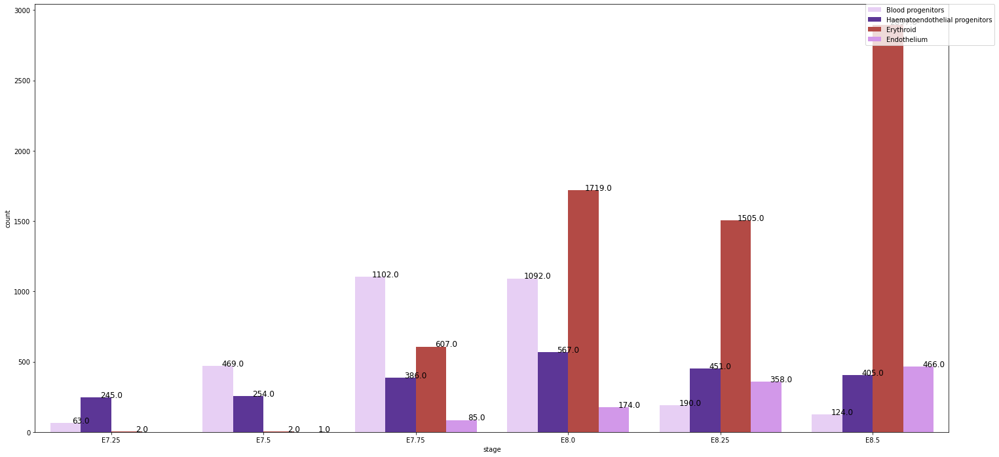

In [89]:
cp = hem.obs[['stage','celltype']]
cp = cp[cp['stage'].isin(['E7.25','E7.5','E7.75','E8.0','E8.25','E8.5'])]
cp = cp.sort_values(by='stage')
import seaborn as sns
fig, ax = plot.subplots(figsize=(25,12))

sns.countplot(x='stage',hue='celltype',data=cp,palette=[ "#e9c9fa","#5826a6",'#C53933', "#D88AF7"])
for p in ax.patches:
    ax.annotate(f'\n{p.get_height()}', (p.get_x()+0.2, round(p.get_height())), ha='center', va='baseline', color='black', size=12)
plot.legend(bbox_to_anchor=(1.05, 1), loc=1, borderaxespad=0.)
plot.savefig('blood_mouse_count.pdf')

In [90]:
#human = ad.read_csv('heman.csv')
#human.obs['cl'] = list(pd.read_csv('heman_cl.csv')['sub_cl'])
mo = pd.read_csv('hep78.csv')
g7 = list(mo['E7.25'])
g8 = list(mo['E8.25'])
#g8 = g7+g8
with open('Genes/bp7.txt', 'r') as f:
    x = f.read().splitlines()
 


---------------------------------------------------------------------------
FileNotFoundError                         Traceback (most recent call last)
script_5989885099832426475 in <module>
----> mo = pd.read_csv('hep78.csv')
      g7 = list(mo['E7.25'])
      g8 = list(mo['E8.25'])
      with open('Genes/bp7.txt', 'r') as f:

FileNotFoundError: 2


In [ ]:
%get x
convertMouseGeneList <- function(x){
 
require("biomaRt")
human = useMart("ensembl", dataset = "hsapiens_gene_ensembl")
mouse = useMart("ensembl", dataset = "mmusculus_gene_ensembl")
 
genesV2 = getLDS(attributes = c("mgi_symbol"), filters = "mgi_symbol", values = x , mart = mouse, attributesL = c("hgnc_symbol"), martL = human, uniqueRows=T)
humanx <-genesV2[, 2]
mousex <-genesV2[, 1]
# Print the first 6 genes found to the screen
print(head(humanx))
return(list(v1=humanx,v2=mousex))

}
hmg<-convertMouseGeneList(x)


In [ ]:
%get hmg --from R

g8=g8t[:15]
g7=g7t[:15]

sc.pl.heatmap(human, var_names=g7+g8,groupby='cl',show_gene_labels=True,var_group_positions=[(0,14),(15,29)],standard_scale='var')


In [ ]:
#sc.pl.heatmap(human, var_names=g7t+g8t,groupby='cl',show_gene_labels=True,var_group_positions=[(0,19),(20,39)],standard_scale='var')
sc.pl.stacked_violin(human, var_names=g7+g8, groupby='cl',swap_axes=False,
                     jitter=True,stripplot=True,size=2,standard_scale='var')


,Unnamed: 0,X,X0,X1,cluster_id,sub_cluster,cell_name
0,1,0,12.213498,-0.550328,Hemogenic Endothelial Progenitors,Blood Progenitors,SS.sc7785290
43,44,43,12.049977,-0.318634,Hemogenic Endothelial Progenitors,Blood Progenitors,SS.sc7785378
114,115,114,12.341313,-0.469138,Hemogenic Endothelial Progenitors,Blood Progenitors,SS.sc7785503
199,200,199,12.059435,-0.579377,Hemogenic Endothelial Progenitors,Blood Progenitors,SS.sc7785312
259,260,259,11.943340,-0.633564,Hemogenic Endothelial Progenitors,Blood Progenitors,SS.sc7785627
266,267,266,12.094590,-0.466107,Hemogenic Endothelial Progenitors,Blood Progenitors,SS.sc7785351
283,284,283,12.216265,-0.254263,Hemogenic Endothelial Progenitors,Blood Progenitors,SS.sc7785641
408,409,408,12.031349,-0.722229,Hemogenic Endothelial Progenitors,Blood Progenitors,SS.sc7785640
496,497,496,12.354264,-0.469353,Hemogenic Endothelial Progenitors,Blood Progenitors,SS.sc7785408
782,783,782,12.286066,-0.579570,Hemogenic Endothelial Progenitors,Blood Progenitors,SS.sc7785355


In [164]:
#hem = mouse_c[mouse_c.obs['stage'].isin(["E7.5"])].copy()
#hem = mouse_c[mouse_c.obs['celltype'].isin(['PGC'])]
#hem = mouse_c[mouse_c.obs['celltype'].isin(['PGC'])]

#sc.pp.log1p(hem)

#hem
#sc.pp.normalize_total(hem)
#hem.obs['typ_st']=list(hem.obs['stage']+' ' +hem.obs['celltype'])

human = ad.read_csv("script_heart+gastr/norm_true_data.csv")
human.obs = pd.read_csv('ori_gast_umap.csv')
humnames  = list(human.var_names)
gab = pd.read_csv('Data/gabriele_cells.csv',sep=';')
#human = human[human.obs['cell_name'].isin(list(gab['x']))]


In [165]:
%get humnames
convertMouseGeneList <- function(x){
 
require("biomaRt")
human = useMart("ensembl", dataset = "hsapiens_gene_ensembl")
mouse = useMart("ensembl", dataset = "mmusculus_gene_ensembl")
 
genesV2 = getLDS(attributes = c("mgi_symbol"), filters = "mgi_symbol", values = x , mart = mouse, attributesL = c("hgnc_symbol"), martL = human, uniqueRows=T)
humanx <-genesV2[, 2]
mousex <-genesV2[, 1]
# Print the first 6 genes found to the screen
print(head(humanx))
return(list(v1=humanx,v2=mousex))

}
hmg<-convertMouseGeneList(humnames)

Ensembl site unresponsive, trying asia mirror



ERROR: Error in textConnection(bmResult): invalid 'text' argument


In [166]:
%get hmg --from R
hgenes = hmg['v1']
mgenes = hmg['v2']
hmg = pd.DataFrame(hmg)
hmg = hmg.drop_duplicates(subset='v1',keep='first')
hmg = hmg.drop_duplicates(subset='v2',keep='first')
#human = ad.read_csv('heman.csv')
#ery = ad.read_csv('epi.csv')
#human.obs['cl'] = list(pd.read_csv('heman_cl.csv')['sub_cl'])
#human = ad.read_csv("script_heart+gastr/norm_true_data.csv")
#human.obs = pd.read_csv('ori_gast_umap.csv')

mouse = hem.copy()
hmg = hmg[hmg['v2'].isin(mouse.var_names)]
hmg = hmg[hmg['v1'].isin(human.var_names)]

hgenes = hmg['v1']
mgenes = hmg['v2']
human = human[:,list(hgenes)]
human = human[human.obs['cluster_id'].isin(['Hemogenic Endothelial Progenitors','Erythrocytes'])]

human.obs['cell_name'].isin(list(gab['x']))['sub_cluster']='Megakaryocytes'
mouse = mouse[:,mgenes]
mouse.var_names=human.var_names
emb4 = mouse.to_df()
emb2 = human.to_df()
m_cluster = list(mouse.obs['celltype'])
h_cluster = list(human.obs['sub_cluster'])

In [168]:
set(human.obs['sub_cluster'])

{'Blood Progenitors',
 'Erythro-Myeloid Progenitors',
 'Erythrocytes',
 'Hemogenic Endothelium',
 'Myeloid Progenitors'}

In [180]:
%get emb4
%get emb2
%get m_cluster
%get h_cluster
library(Seurat)
library(ggplot2)
library(cowplot)
n_feat = 3000
emb2<-t(emb2)
emb2 <- CreateSeuratObject(counts = emb2, project = "embryo2")
#emb2@meta.data$stage <- h_cluster
#emb2$RNA@var.features


emb2 <- subset(emb2, subset = nFeature_RNA > 0)
#emb2 <- NormalizeData(emb2, verbose = FALSE)
emb2 <- FindVariableFeatures(emb2, selection.method = "vst", nfeatures = n_feat)
#emb2$RNA@var.features<-all_human_high_varå


emb4<-t(emb4)
emb4 <- CreateSeuratObject(counts = emb4, project = "embryo4")
emb4 <- subset(emb4, subset = nFeature_RNA > 0)
emb4 <- NormalizeData(emb4, verbose = FALSE)
emb4 <- FindVariableFeatures(emb4, selection.method = "vst", nfeatures = n_feat)
#emb4$RNA@var.features<-all_human_high_var

#emb4@meta.data$stage <- m_cluster

Warning message:
“The following arguments are not used: row.names”
Warning message:
“The following arguments are not used: row.names”


In [184]:
Sys.setenv(LANG = "en")

xenopus.anchors <- FindIntegrationAnchors(object.list = list(emb2, emb4),dims = 1:20, anchor.features = n_feat)
xenopus.combined <- IntegrateData(anchorset = xenopus.anchors, dims = 1:20)
DefaultAssay(xenopus.combined) <- "integrated"
xenopus.combined <- ScaleData(xenopus.combined, verbose = FALSE)


Warning message in CheckDuplicateCellNames(object.list = object.list):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”
Computing 3000 integration features

Scaling features for provided objects

Finding all pairwise anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 711 anchors

Filtering anchors

Warning message in FilterAnchors(object = object.pair, assay = assay, slot = slot, :
“Number of anchor cells is less than k.filter. Retaining all anchors.”
Merging dataset 1 into 2

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data



In [185]:
integ <- xenopus.combined$integrated[1:n_genes]
integ <- as.data.frame(integ)
write.csv(file='Data/seurat_integrated_bp.csv',integ,sep=',')

Warning message in write.csv(file = "Data/seurat_integrated_bp.csv", integ, sep = ","):
“attempt to set 'sep' ignored”


In [ ]:
import scipy
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import cut_tree

#X = seur.X
seur = ad.read_csv('Data/seurat_integrated_bp.csv').T
msdf = seur.to_df()
#h_cluster.append(m_cluster)
#typ_st=list(mouse.obs['celltype'])
m_cluster=list(mouse.obs['stage']+' ' +mouse.obs['celltype'])
msdf['typ_st']=h_cluster+m_cluster
msdf = msdf.groupby('typ_st').mean()
X = np.array(msdf)
def spearman_dist(X1,X2):
    return np.sqrt(0.5*(1.0-scipy.stats.spearmanr(X1,X2)[0]));


Z = linkage(X, 'average',metric=spearman_dist)
from matplotlib import pyplot as plt
plt.figure(figsize=(25, 10))
dendrogram(
    Z,
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=25,
    labels=msdf.index,
    color_threshold = 0,
    above_threshold_color='black')
color_human = dict(zip(set(h_cluster), ["#256676"]*len(set(h_cluster))))
color_mouse = dict(zip(set(m_cluster), ["#7b2750"]*len(set(m_cluster))))

label_colors = z = {**color_human, **color_mouse}

ax = plt.gca()
xlbls = ax.get_xmajorticklabels()
for lbl in xlbls:
    lbl.set_color(label_colors[lbl.get_text()])

plt.show()


In [111]:

new= []
for x in list(mouse.obs['celltype']):
    if x=='Blood progenitors 1':
        new.append('Blood progenitors')
    elif x=='Blood progenitors 2':
        new.append('Blood progenitors')
    elif x=='Erythroid1':
        new.append('Erythroid')
    elif x=='Erythroid2':
        new.append('Erythroid')
    elif x=='Erythroid3':
        new.append('Erythroid')
    else:
        new.append(x)
mouse.obs['celltype']=new

#m6 = mouse[mouse.obs['celltype']=='PGC']
#mouse.obs['typ_st']=list(mouse.obs['stage']+' ' +mouse.obs['celltype'])

"\nnew= []\nfor x in list(mouse.obs['celltype']):\n    if x=='Blood progenitors 1':\n        new.append('Blood progenitors')\n    elif x=='Blood progenitors 2':\n        new.append('Blood progenitors')\n    elif x=='Erythroid1':\n        new.append('Erythroid')\n    elif x=='Erythroid2':\n        new.append('Erythroid')\n    elif x=='Erythroid3':\n        new.append('Erythroid')\n    else:\n        new.append(x)\nmouse.obs['celltype']=new\n"

In [85]:
msdf = mouse.to_df()
msdf['typ_st']=list(mouse.obs['celltype'])
med_mouse = msdf.groupby('typ_st').median()
#msdf = msdf.drop('cell_type')
m7 = ad.AnnData(med_mouse)
#sc.pp.log1p(m7)
#m7 = m7[m7.obs.index!='Caudal epiblast'].copy()
#m7 = m7[m7.obs.index!='Rostral neurectoderm'].copy()

In [86]:
annot = list(m7.obs.index)
exmdf = m7.to_df()
human.var_names= list(m7.var_names)
#sc.pp.log1p(human)
lgdf = human.copy()
#lgdf = lgdf[:,hgenes]

#lgdf.var_names = list(mouse_mo.var_names)
lgdf.var_names_make_unique()
lgdf = lgdf.to_df()
lgdf

,mt-Atp8,mt-Co2,mt-Nd4,mt-Nd1,mt-Co3,mt-Nd2,mt-Atp6,mt-Co1,mt-Nd3,mt-Nd6,mt-Nd4l,mt-Nd5,Tekt4,Tbl1x,Dazl,Sry,Kdm5d,Hsfy2,Ddx3y,Tmsb4x,Pcdh11x,Usp9y,Zfx,Uty,Dok5,Pstpip2,Crmp1,Zbed4,Wdr19,Hmgb3,Rgs19,Dnajc15,Itm2a,Rbbp8nl,Amelx,Pds5a,Zbtb7c,Diaph3,Cbr3,Dhx15,...,Vwa5b2,Msrb1,Bbs4,Decr2,Cluh,Eif3b,Nrp2,Msh4,Nat8,Tgfb2,Gcg,Clint1,Actrt2,Ldlrad2,Tppp3,Lair1,Dchs1,Fam53a,Ints5,Abi2,Fam43a,Plbd1,Fam98a,Asb7,Mpp2,Ly9,Asprv1,Calr,Kcnj14,Inppl1,Pmf1,Ik,Ctsk,Nsun5,Kng1,Hsd17b7,Spata17,Pkd1l3,Tdrkh,Myo1h
0,2.690627,7.230877,6.684721,5.214174,5.778838,5.568334,4.992892,7.952705,0.000000,3.742959,5.045495,5.649940,0.000000,0.0,0.0,0.000000,0.000000,0.0,3.097380,0.000000,0.0,0.0,0.0,4.213469,0.0,4.005635,0.000000,0.000000,0.000000,0.000000,3.420864,4.660060,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,...,0.0,3.717607,0.0,3.609235,0.000000,4.660060,0.000000,0.0,0.0,0.0,0.0,4.746282,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,3.519478,0.000000,0.0,0.000000,0.0,4.228986,0.0,0.000000,0.0,4.660060,0.0,3.188576,0.0,4.532153,0.0,0.0,0.000000,0.0
43,1.905337,6.291182,6.453865,5.111836,5.702050,4.963461,5.609873,7.437330,0.000000,3.667260,3.960719,5.835960,0.000000,0.0,0.0,0.000000,0.000000,0.0,3.782200,1.571622,0.0,0.0,0.0,2.845572,0.0,4.820410,0.000000,0.000000,4.474819,4.172725,0.000000,3.960719,3.355319,0.0,0.0,0.000000,0.0,0.0,0.0,3.045753,...,0.0,0.000000,0.0,0.000000,0.000000,4.257224,0.000000,0.0,0.0,0.0,0.0,4.430391,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,2.950663,3.960719,0.0,0.000000,0.0,4.587703,0.0,0.000000,0.0,5.813426,0.0,3.691329,0.0,0.000000,0.0,0.0,3.923711,0.0
114,2.340211,6.516022,6.303867,4.596786,5.411810,5.498181,5.249745,7.157372,1.152281,2.736705,4.829512,5.365656,0.000000,0.0,0.0,0.543371,0.000000,0.0,3.182115,4.144324,0.0,0.0,0.0,3.956000,0.0,5.421429,0.000000,0.000000,0.000000,3.723786,3.632624,3.593697,0.000000,0.0,0.0,0.893474,0.0,0.0,0.0,4.667047,...,0.0,0.543371,0.0,0.543371,0.000000,4.292924,0.000000,0.0,0.0,0.0,0.0,5.160390,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,4.048310,0.0,0.000000,0.0,4.567238,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0
199,2.449358,6.328430,6.478463,5.009891,5.634369,5.345177,5.096767,7.082127,0.000000,3.733185,4.671042,4.612769,0.000000,0.0,0.0,0.000000,0.000000,0.0,3.618387,2.512577,0.0,0.0,0.0,0.000000,0.0,5.601429,0.000000,0.000000,0.000000,2.681297,3.618387,4.266720,0.000000,0.0,0.0,1.952493,0.0,0.0,0.0,0.000000,...,0.0,0.000000,0.0,4.484925,0.000000,4.277266,0.000000,0.0,0.0,0.0,0.0,3.555635,0.0,1.554356,0.0,0.0,0.0,3.714944,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,5.816545,0.0,0.000000,0.0,4.405112,0.0,0.000000,0.0,3.714944,0.0,0.0,0.000000,0.0
259,1.991380,6.346175,6.238542,2.929153,4.451594,3.629360,4.958849,7.493437,1.567653,3.867229,4.014588,5.045652,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,3.056042,0.0,0.0,0.0,2.994577,0.0,5.237711,0.000000,0.000000,0.000000,2.516579,3.893346,2.408837,0.000000,0.0,0.0,3.055982,0.0,0.0,0.0,0.000000,...,0.0,0.000000,0.0,3.269666,1.801794,3.725310,0.000000,0.0,0.0,0.0,0.0,4.995554,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,2.408837,0.0,4.238688,0.0,0.000000,0.0,4.978281,0.0,0.000000,0.0,3.755350,0.0,0.0,3.943620,0.0
266,1.760620,6.288733,6.304703,4.381815,5.068692,4.904430,5.080737,7.278423,0.000000,3.813475,4.626314,4.725015,0.000000,0.0,0.0,0.000000,1.579563,0.0,4.663342,3.364985,0.0,0.0,0.0,4.838004,0.0,5.172209,0.000000,0.000000,0.000000,0.000000,0.000000,4.152748,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,4.527261,...,0.0,0.000000,0.0,3.547094,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,4.357435,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,4.381815,0.0,0.000000,0.0,5.056499,0.0,0.000000,0.0,4.239711,0.0,0.0,4.766849,0.0
283,3.420243,7.639069,6.447489,5.737446,6.663772,5.400605,6.156487,7.467570,2.302750,4.813527,4.917552,5.762009,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000

In [87]:
%get exmdf
%get annot
#annn<-as.data.frame(annot)
#row.names(annn)<-rownames(exmdf)
library(SingleCellExperiment)
library(scmap)
#data<-sample_n(t(exmdf), 5000)
sce<-SingleCellExperiment(assays = list(normcounts = t(as.matrix(exmdf))), colData = annot)
logcounts(sce) <- log2(normcounts(sce) + 1)
# use gene names as feature symbols
rowData(sce)$feature_symbol <- rownames(sce)
#isSpike(sce, "ERCC") <- grepl("^ERCC-", rownames(sce))
sce <- sce[!duplicated(rownames(sce)), ]


In [ ]:
%get lgdf
#%get ct
sce_pro <- SingleCellExperiment(assays = list(logcounts = t(as.matrix(lgdf))))
sce <- selectFeatures(sce, suppress_plot = TRUE,n_features=4200)
#as.data.frame(rowData(sce))$scmap_features
#logcounts(sce_pro) <- log2(normcounts(sce_pro) + 1)

colData(sce)$cell_type <- annot
rowData(sce)$feature_symbol <- rownames(sce)
rowData(sce_pro)$feature_symbol <- rownames(sce_pro)
sce <- indexCluster(sce,cluster_col='cell_type')
scmapCluster_results <- scmapCluster(
  projection = sce_pro, 
  index_list = list(
    yan = metadata(sce)$scmap_cluster_index
  ), threshold = 0
)
map_results<-scmapCluster_results$scmap_cluster_labs
barplot(prop.table(table(as.data.frame(map_results)$yan)),las=2.0, cex.names=0.4,ylab='fraction allocated',)


In [91]:
prop.table(table(as.data.frame(map_results)$yan))#endo-600,epi-4500,ps-5500,ecto-3000,axm,ysm,advm,nm-5500,em-4800


Endothelium   Erythroid 
 0.92307692  0.07692308 

In [355]:
nmm<-merge(dep,depn,by='Var1',all=TRUE)
ysmm<-merge(nmm,hypo,by='Var1',all=TRUE)
emm<-merge(yse,ysmm,by='Var1',all=TRUE)
row.names(emm)<-emm$Var1
emm$Var1<-NULL
emm[ is.na(emm) ] <- 0
emm<-as.matrix(emm)
emm = t(t(emm)/apply(emm,2,sum))
colnames(emm)<-c('YSE','DE(P)','DE(NP)','Hypoblast')
emm<-as.data.frame(emm)
write.csv(emm, 'Data/endoderm_mouse.csv')

Warning message in merge.data.frame(yse, ysmm, by = "Var1", all = TRUE):
“column names ‘Freq.x’, ‘Freq.y’ are duplicated in the result”

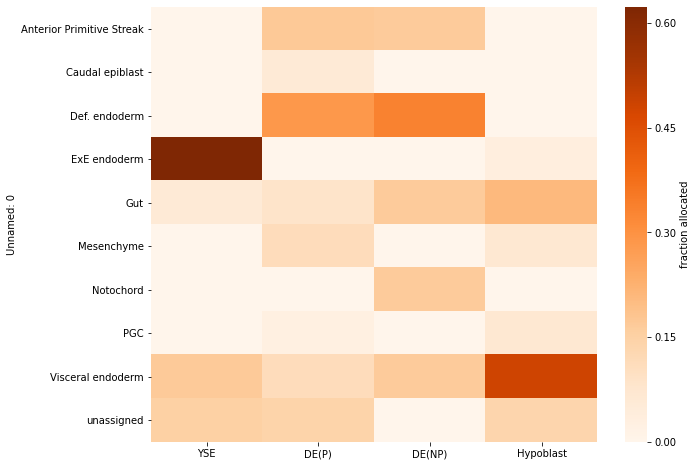

In [375]:
emm = pd.read_csv('Data/endoderm_mouse.csv')
emm.index = emm['Unnamed: 0']
emm=emm.drop('Unnamed: 0',axis=1)
emm=emm.sort_index()
f, ax = plot.subplots(figsize=(10, 8))
ax= sns.heatmap(emm,cmap='Oranges',vmin=0,cbar_kws={'label': 'fraction allocated'})

#ax = sns.heatmap(epip,cmap='seismic',cbar_kws={'label': 'z-score'},vmax=6,vmin=-6,linewidths=0.03,linecolor='black')
plot.savefig('endoderm_mouse.pdf')


In [695]:
#em<-as.data.frame(table(as.data.frame(map_results)$yan))
#nm,adv,ysm,em, epi,ps,ecto
#endo-600,epi-4500,ps-5500,ecto-3000,axm,ysm,advm,nm-5500,em-4800
library(gplots)
nmm<-merge(nm,advm,by='Var1',all=TRUE)
ysmm<-merge(nmm,ysm,by='Var1',all=TRUE)
emm<-merge(em,ysmm,by='Var1',all=TRUE)
emm<-merge(axm,emm,by='Var1',all=TRUE)
emm<-merge(ps,emm,by='Var1',all=TRUE)
emm<-merge(epi,emm,by='Var1',all=TRUE)
emm<-merge(ecto,emm,by='Var1',all=TRUE)
emm<-merge(endo,emm,by='Var1',all=TRUE)
row.names(emm)<-emm$Var1
emm$Var1<-NULL
emm[ is.na(emm) ] <- 0
emm<-as.matrix(emm)
emm = t(t(emm)/apply(emm,2,sum))
emm<-as.data.frame(emm)
colnames(emm)<-c('Endo','Amnion','Epi','PS','Axial Mesoderm','Emergent Mesoderm','Nascent Mesoderm','Advanced Mesoderm','YS Mesoderm')

write.csv(emm, 'Data/mouse_all_comp.csv')




Warning message in merge.data.frame(em, ysmm, by = "Var1", all = TRUE):
“column names ‘Freq.x’, ‘Freq.y’ are duplicated in the result”Warning message in merge.data.frame(ps, emm, by = "Var1", all = TRUE):
“column names ‘Freq.x’, ‘Freq.y’ are duplicated in the result”Warning message in merge.data.frame(ecto, emm, by = "Var1", all = TRUE):
“column names ‘Freq.x’, ‘Freq.y’ are duplicated in the result”

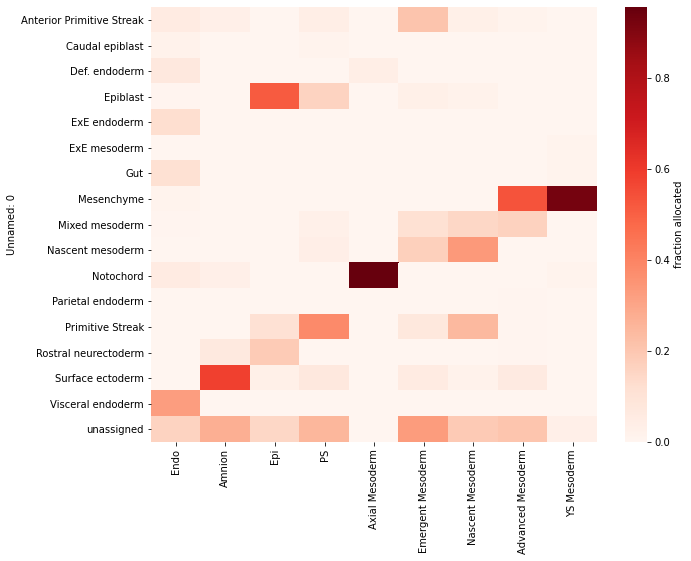

In [16]:
import matplotlib.pyplot as plot
import seaborn as sns
emm = pd.read_csv('Data/mouse_all_comp.csv')
emm.index = emm['Unnamed: 0']
emm=emm.drop('Unnamed: 0',axis=1)
emm=emm.sort_index()
emm=emm.drop('PGC')
f, ax = plot.subplots(figsize=(10, 8))
ax= sns.heatmap(emm,cmap='Reds',vmin=0,cbar_kws={'label': 'fraction allocated'})

#ax = sns.heatmap(epip,cmap='seismic',cbar_kws={'label': 'z-score'},vmax=6,vmin=-6,linewidths=0.03,linecolor='black')
plot.savefig('all_comp_mouse.pdf')


In [6]:
sns.heatmap(emm,cmap='Reds',vmin=0,cbar_kws={'label': 'fraction allocated'})

In [ ]:
import scvelo as scv
scv.settings.set_figure_params('scvelo',vector_friendly=False,format='pdf')
import matplotlib.colors as clr

stg=pd.read_csv('Data_plot/E725.csv')
stg = stg.sort_values(by='Unnamed: 0')
stg.index=stg['Unnamed: 0']
stg=stg.drop('Unnamed: 0',axis=1)
ax.set_xlabel('X_axi',fontsize=30);
ax.set_ylabel('Y_axis',fontsize=30);
stg = [[0.16,0,0.63,0.14,0.06,0,0,0,0],
    [0.11,0.06,0.11,0,0.74,0,0,0,0],
    [0,0,0,0,0,0,0.04,0,0.96],
     [0,0,0,0,0,0,0.06,0,0.94],
      [0,0,0,0,0,0,0,0.085,0.915],
       [0,0,0,0,0.04,0,0.04,0,0.92],
       [0,0,0,0,0,0,0.07,0,0.93]
       ]
stg=pd.DataFrame(stg)
stg.columns = ['E6.5','E6.75',"E7.0","E7.25","E7.5","E7.75","E8.0","E8.25","E8.5"]
stg.index = ['Epiblast','PS','Macrophages','EMP','MEP',"Erythrocytes",'Endothelium']
plot.figure(figsize=(7, 2))
cmap = clr.LinearSegmentedColormap.from_list('custom blue', ['#EEC0C6',"Purple"], N=2200)

sns.heatmap(stg,cmap='Purples',linecolor='grey',linewidths=0.01,vmax=1)
plot.savefig('staging.pdf')

In [ ]:
import scvelo as scv
scv.settings.set_figure_params('scvelo',vector_friendly=False,format='pdf')
import matplotlib.colors as clr

stg = [
    [0,0,0,0,0,0.96,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.04],
    [0,0,0,0,0,0.92,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.08],
    [0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0],
    [0,0,0,0,0,0,0,0,0,0,0.04,0,0,0,0,0,0,0.92,0,0,0,0,0,0,0.04],
    [0,0,0,0,0,0.1,0,0,0,0,0,0.86,0,0,0,0,0,0,0,0,0.02,0,0,0.02,0]
       ]
stg=pd.DataFrame(stg)
stg.columns = ["E7.25","E7.5","E7.75","E8.0","E8.25","E8.5","E7.25","E7.5","E7.75","E8.0","E8.25","E8.5"
              ,"E7.25","E7.5","E7.75","E8.0","E8.25","E8.5","E7.25","E7.5","E7.75","E8.0","E8.25","E8.5",'unassigned']
stg.index = ['Blood progenitors','EMP','Myeloid progenitors',"Erythrocytes",'Endothelium']

plot.figure(figsize=(7, 2))
cmap = clr.LinearSegmentedColormap.from_list('custom blue', ['#eaebec',"#7c7093"], N=2200)

sns.heatmap(stg,cmap=cmap,linecolor='grey',linewidths=0.01,vmax=1)
plot.savefig('staging.pdf')

In [ ]:
%get m_names 
convertMouseGeneList <- function(x){
 
require("biomaRt")
human = useMart("ensembl", dataset = "hsapiens_gene_ensembl")
mouse = useMart("ensembl", dataset = "mfascicularis_gene_ensembl")
 
genesV2 = getLDS(attributes = c("mgi_symbol"), filters = "mgi_symbol", values = x , mart = mouse, attributesL = c("hgnc_symbol"), martL = human, uniqueRows=T)
humanx <-genesV2[, 2]
mousex <-genesV2[, 1]
# Print the first 6 genes found to the screen
print(head(humanx))
return(list(v1=humanx,v2=mousex))

}
hmg<-convertMouseGeneList(m_names)

## Monkey comparison


In [81]:
import scanpy as sc
import pandas as pd
import numpy as np
import anndata as ad
import matplotlib.pyplot as plot
import seaborn as sns
from collections import Counter
from sklearn import metrics
from sklearn.metrics import pairwise_distances
from numba import jit
from scipy import spatial
from IPython import get_ipython
get_ipython().run_line_magic('matplotlib', 'inline')

monkey = ad.read_csv('monkey.csv').T
monkey.obs = pd.read_csv('monkey-meta.csv')
monkey= monkey[monkey.obs['annotation']!='TE and derivatives'].copy()
monkey= monkey[monkey.obs['stage'].isin(['d.p.f.16'])]

sc.pp.log1p(monkey)
human = ad.read_csv("script_heart+gastr/norm_true_data.csv")
human.obs = pd.read_csv('ori_gast_umap.csv')
monk_gene= pd.read_csv('Genes/gene_symbol_monkey.csv')
monk_gene= monk_gene[monk_gene['MF5Symbol'].isin(monkey.var_names)]
monkey=monkey[:,list(monk_gene['MF5Symbol'])]
monkey.var_names=monk_gene['HsSymbol']

/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/scanpy/preprocessing/_simple.py:339: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [5]:
hmg = pd.read_csv('monkey_human.txt',sep='\t')
emb4= monkey.to_df()
emb2= human.to_df()
emb4 = emb4.rename(columns = {'T':'TBXT'})

#hgenes = hmg['Gene name']
#mgenes = hmg['Macaque gene name']
#hmg = pd.DataFrame(hmg)
hmg = hmg.drop_duplicates(subset='Gene name',keep='first')
hmg = hmg.drop_duplicates(subset='Macaque gene name',keep='first')
hmg = hmg[hmg['Macaque gene name'].isin(monkey.var_names)]
hmg = hmg[hmg['Gene name'].isin(human.var_names)]

hgenes = list(hmg['Gene name'])
mgenes = hmg['Macaque gene name']
emb2 = emb2.loc[:,hgenes]
emb4 = emb4.loc[:,mgenes]
emb2.columns = emb4.columns

m_cluster = list(monkey.obs['annotation'])
h_cluster = list(human.obs['sub_cluster'])



Index(['AGBL2', 'ACSF2', 'LOC101864766', 'LOC101864767', 'LOC101864774', 'TTR',
       'PYCR2', 'LOC101864778', 'ZNRF4', 'LOC101864783',
       ...
       'LOC102147310', 'LOC102147312', 'IRX2', 'LOC102147316', 'LOC102147318',
       'AP2A2', 'LOC102147320', 'LOC102147321', 'DENND5A', 'LOC102147323'],
      dtype='object', length=25931)

In [55]:
monk_gene

,MF5ID,MF5Symbol,HsID,HsSymbol
0,101864761,AGBL2,79841.0,AGBL2
1,101864763,ACSF2,80221.0,ACSF2
2,101864766,LOC101864766,57335.0,ZNF286A
3,101864767,LOC101864767,NaN,NaN
4,101864774,LOC101864774,6462.0,SHBG
...,...,...,...,...
28545,102147319,AP2A2,161.0,AP2A2
28546,102147320,LOC102147320,NaN,NaN
28547,102147321,LOC102147321,NaN,NaN
28548,102147322,DENND5A,23258.0,DENND5A


In [69]:
%get emb4
%get emb2
%get m_cluster
%get h_cluster
library(Seurat)
library(ggplot2)
library(cowplot)
n_feat = 5500
emb2<-t(emb2)
emb2 <- CreateSeuratObject(counts = emb2, project = "embryo2")
emb2@meta.data$stage <- h_cluster
emb2$RNA@var.features


emb2 <- subset(emb2, subset = nFeature_RNA > 0)
emb2 <- NormalizeData(emb2, verbose = FALSE)
emb2 <- FindVariableFeatures(emb2, selection.method = "vst", nfeatures = n_feat)
#emb2$RNA@var.features<-all_human_high_var


emb4<-t(emb4)
emb4 <- CreateSeuratObject(counts = emb4, project = "embryo4")
emb4 <- subset(emb4, subset = nFeature_RNA > 0)
emb4 <- NormalizeData(emb4, verbose = FALSE)
emb4 <- FindVariableFeatures(emb4, selection.method = "vst", nfeatures = n_feat)
#emb4$RNA@var.features<-all_human_high_var

emb4@meta.data$stage <- m_cluster

logical(0)

Warning message in CheckDuplicateCellNames(object.list = object.list):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”Computing 3000 integration features
Scaling features for provided objects
Finding all pairwise anchors
Running CCA
Merging objects
Finding neighborhoods
Finding anchors
	Found 1517 anchors
Filtering anchors
	Retained 906 anchors
Extracting within-dataset neighbors
Merging dataset 2 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data


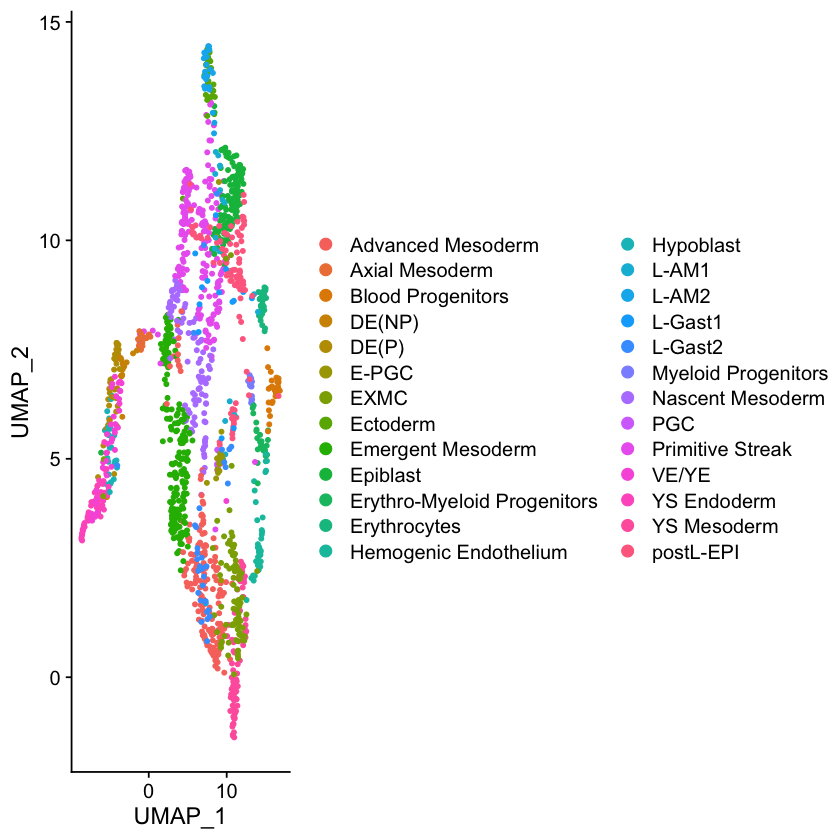

In [70]:
n_genes = 3000
xenopus.anchors <- FindIntegrationAnchors(object.list = list(emb2, emb4),dims = 1:20,   = n_genes,k.filter=70)
xenopus.combined <- IntegrateData(anchorset = xenopus.anchors, dims = 1:10)
DefaultAssay(xenopus.combined) <- "integrated"
xenopus.combined <- ScaleData(xenopus.combined, verbose = FALSE)
xenopus.combined <- RunPCA(object = xenopus.combined, npcs = 50, verbose = FALSE)

xenopus.combined <- RunUMAP(object = xenopus.combined, reduction = "pca", 
    dims = 1:20,min.dist=0.5)
DimPlot(object = xenopus.combined, reduction = "umap", group.by = "stage")

In [71]:
integ <- xenopus.combined$integrated[1:n_genes]
integ <- as.data.frame(integ)
write.csv(file='seurat_integrated_monk.csv',integ,sep=',')

Warning message in write.csv(file = "seurat_integrated_monk.csv", integ, sep = ","):
“attempt to set 'sep' ignored”

In [ ]:
import scipy
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import cut_tree

#X = seur.X
seur = ad.read_csv('seurat_integrated_monk.csv').T
msdf = seur.to_df()
#h_cluster.append(m_cluster)
typ_st=list(monkey.obs['annotation'])

msdf['typ_st']=h_cluster+typ_st
msdf = msdf.groupby('typ_st').mean()
X = np.array(msdf)
def spearman_dist(X1,X2):
    return np.sqrt(0.5*(1.0-scipy.stats.spearmanr(X1,X2)[0]));



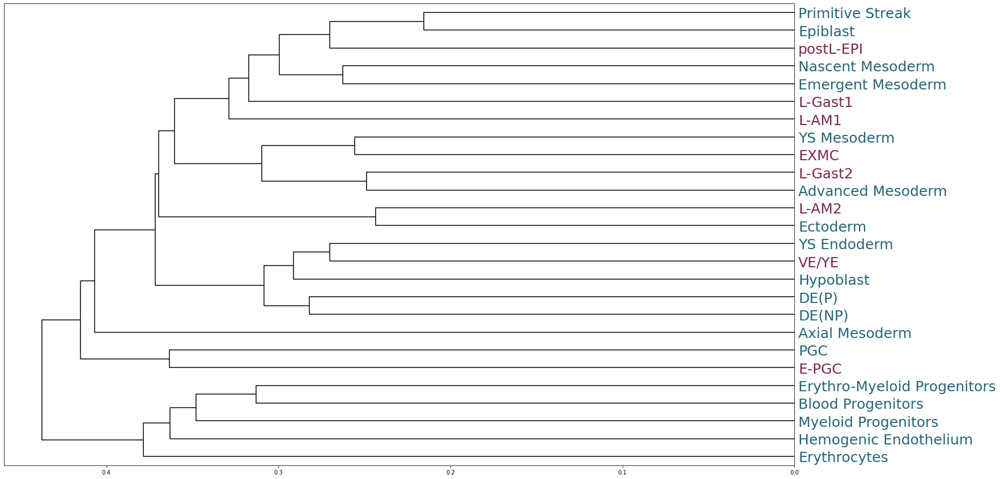

In [78]:

Z = linkage(X, 'average',metric=spearman_dist)
from matplotlib import pyplot as plt
plt.figure(figsize=(25, 15))
dendrogram(
    Z,  # rotates the x axis labels
    leaf_font_size=25,
    labels=msdf.index,
    color_threshold = 0,
    above_threshold_color='black',
    orientation='left')
color_human = dict(zip(set(h_cluster), ["#256676"]*len(set(h_cluster))))
color_mouse = dict(zip(set(typ_st), ["#7b2750"]*len(set(typ_st))))

label_colors = z = {**color_human, **color_mouse}

ax = plt.gca()
xlbls = ax.get_ymajorticklabels()
for lbl in xlbls:
    lbl.set_color(label_colors[lbl.get_text()])

#plt.show()
plt.savefig('r_figures/monkey_dendogram.pdf',format='pdf',bbox_inches='tight')  


/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'stage' as categorical
... storing 'annotation' as categorical


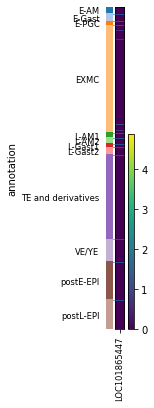

In [84]:
'''for i in monkey.var_names:
    if i[:3]=='SOX':
        print(i)
        '''

monkey = ad.read_csv('monkey.csv').T
monkey.obs = pd.read_csv('monkey-meta.csv')
#monkey= monkey[monkey.obs['annotation']!='TE and derivatives'].copy()
#monkey= monkey[monkey.obs['stage'].isin(['d.p.f.16'])]
sc.pp.log1p(monkey)


sc.pl.heatmap(monkey,var_names='LOC101865447',groupby='annotation')


In [85]:
m75 = mouse[mouse.obs['stage'].isin(['E7.5'])].copy()
dppa5 = mouse_c[mouse_c.obs['stage'].isin(['E7.5'])].copy()
dppa5 = dppa5[dppa5.obs['celltype'].isin(['PGC','Epiblast','Primitive Streak'])]
dppa5 = dppa5[:,'Dppa5a']
m75.var_names = human.var_names
m_pgc = m75[m75.obs['celltype'].isin(['PGC','Epiblast','Primitive Streak'])]
m_pgc2 = m_pgc.to_df()
m_pgc2['DPPA5'] = dppa5.X.toarray()
m_pgc2= ad.AnnData(m_pgc2)
m_pgc2.obs = m_pgc.obs
dppa5 = ad.read_csv("script_heart+gastr/norm_true_data.csv")
dppa5.obs = pd.read_csv('ori_gast_umap.csv')
dppa5= dppa5[dppa5.obs['sub_cluster'].isin(['PGC','Epiblast','Primitive Streak'])].copy()
dppa5 = dppa5[:,'DPPA5']

p_pgc = monkey[monkey.obs['annotation'].isin(['E-PGC','postL-EPI','L-Gast1'])].copy()
h_pgc = human[human.obs['sub_cluster'].isin(['PGC','Epiblast','Primitive Streak'])].copy()
h_pgc2 = h_pgc.to_df()
h_pgc2['DPPA5'] = dppa5.X.toarray()
h_pgc2 = ad.AnnData(h_pgc2)
h_pgc2.obs = h_pgc.obs

pgpc = ['NANOS3','LGALS1', 'VIM',
         'CDX2','HAND1','PDGFA','PRTG','TSPAN12',
         'LAMA4', 'DPPA5','TMEM14A','PDPN','PCSK1N']
hgpc = ['NANOS3','LGALS1', 'VIM',
         'CDX2','HAND1','PDGFA','PRTG','TSPAN12',
         'LAMA4', 'DPPA5','TMEM14A','PDPN','PCSK1N']

mgpgc = ['NANOS3','LGALS1', 'VIM',
         'CDX2','HAND1','PDGFA','PRTG','TSPAN12',
         'LAMA4', 'DPPA5','TMEM14A','PDPN','PCSK1N']
#m_pgc = m_pgc2[:,mgpgc]
p_pgc = p_pgc[:,pgpc].copy()
h_pgc = h_pgc[:,mgpgc].copy()
#m_pgc.var_names = pgpc
#p_pgc.var_names = pgpc

m_pgc.obs['species']='mouse'
p_pgc.obs['species']='primate'
h_pgc.obs['species']='human'
m_pgc.obs['cluster']=list(m_pgc.obs['celltype'])
p_pgc.obs['cluster']=list(p_pgc.obs['annotation'])
h_pgc.obs['cluster']=list(h_pgc.obs['sub_cluster'])


In [86]:
sc.tl.rank_genes_groups(h_pgc, groupby = 'cluster', method= 'wilcoxon', corr_method='benjamini-hochberg')
sc.tl.rank_genes_groups(m_pgc, groupby = 'cluster', method= 'wilcoxon', corr_method='benjamini-hochberg')
sc.tl.rank_genes_groups(p_pgc, groupby = 'cluster', method= 'wilcoxon', corr_method='benjamini-hochberg')

h_scores = pd.DataFrame(h_pgc.uns['rank_genes_groups']['scores'])
m_scores = pd.DataFrame(m_pgc.uns['rank_genes_groups']['scores'])
p_scores = pd.DataFrame(p_pgc.uns['rank_genes_groups']['scores'])



... storing 'cluster_id' as categorical
... storing 'sub_cluster' as categorical
... storing 'species' as categorical
... storing 'cluster' as categorical
... storing 'cluster' as categorical
... storing 'species' as categorical
... storing 'species' as categorical
... storing 'cluster' as categorical


In [54]:
p_pgc = monkey[monkey.obs['annotation'].isin(['E-PGC','postL-EPI','L-Gast1'])].copy()

h_pgc = human[human.obs['sub_cluster'].isin(['PGC','Epiblast','Primitive Streak'])].copy()
m_pgc = m75[m75.obs['celltype'].isin(['PGC','Epiblast','Primitive Streak'])]
sc.tl.rank_genes_groups(h_pgc, groupby = 'sub_cluster', method= 'wilcoxon', corr_method='benjamini-hochberg',n_genes=800)
sc.tl.rank_genes_groups(p_pgc, groupby = 'annotation', method= 'wilcoxon', corr_method='benjamini-hochberg',n_genes=800)


... storing 'cluster_id' as categorical
... storing 'sub_cluster' as categorical


In [47]:
mh.to_excel('mon_human.xlsx',sheet_name='Sheet1')
#mh_same

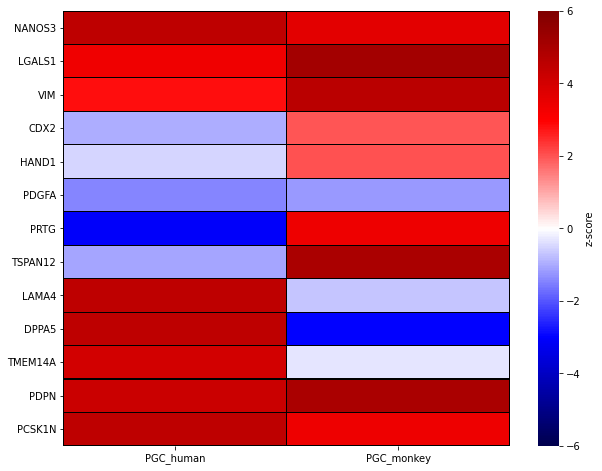

In [87]:
#hse = h_scores['Epiblast']
#hse.index = pd.DataFrame(h_pgc.uns['rank_genes_groups']['names'])['Epiblast']
hsp = h_scores['PGC']
hsp.index = pd.DataFrame(h_pgc.uns['rank_genes_groups']['names'])['PGC']
#hspr = h_scores['Primitive Streak']
#hspr.index = pd.DataFrame(h_pgc.uns['rank_genes_groups']['names'])['Primitive Streak']

#mse = m_scores['Epiblast']
#mse.index = pd.DataFrame(m_pgc.uns['rank_genes_groups']['names'])['Epiblast']
msp = m_scores['PGC']
msp.index = pd.DataFrame(m_pgc.uns['rank_genes_groups']['names'])['PGC']
#mspr = m_scores['Primitive Streak']
#mspr.index = pd.DataFrame(m_pgc.uns['rank_genes_groups']['names'])['Primitive Streak']

#pse = p_scores['postL-EPI']
#pse.index = pd.DataFrame(p_pgc.uns['rank_genes_groups']['names'])['postL-EPI']
psp = p_scores['E-PGC']
psp.index = pd.DataFrame(p_pgc.uns['rank_genes_groups']['names'])['E-PGC']
#pse = pse.sort_index()
#mse = mse.sort_index()
#hse = hse.sort_index()
#pspr = p_scores['L-Gast1']
#pspr.index = pd.DataFrame(p_pgc.uns['rank_genes_groups']['names'])['L-Gast1']

#epis = pd.concat([mse,hse,pse],axis=1)
#epis.columns=['Epi_mouse','Epi_human','Epi_macaque']
#epis_t = epis.iloc[:3,:3].values
#epis_t2 = epis.iloc[3:6,0:3].values
#epis.iloc[:3,:3] =epis_t2
#epis.iloc[3:6,:3] = epis_t
#psp = psp.sort_index()
#msp = msp.sort_index()
#hsp = hsp.sort_index()
#psp = psp.rename(index={'LOC101925698': 'SOX17'})

epip = pd.concat([hsp,psp],axis=1)
epip.columns=['PGC_human','PGC_monkey']
#epipr =  pd.concat([mspr,hspr,pspr],axis=1)
#epipr.columns=['PS_mouse','PS_human','L-Gast1_macaque']
epip=epip.reindex(mgpgc)
#epip['PGC_mouse'].loc['LAMA4']=-2
#z = pd.concat([epis,epip,epipr],axis=1)
import seaborn as sns
f, ax = plot.subplots(figsize=(10, 8))
ax = sns.heatmap(epip,cmap='seismic',cbar_kws={'label': 'z-score'},vmax=6,vmin=-6,linewidths=0.03,linecolor='black')
plot.savefig('figures/monkey_human_pgc.pdf')


In [99]:
p_ps = monkey[monkey.obs['annotation'].isin(['E-PGC','L-Gast1','postL-EPI'])].copy()
sc.pp.highly_variable_genes(p_ps,n_top_genes=3200)
p_ps =p_ps[:, p_ps.var['highly_variable']]

h_ps = human[human.obs['sub_cluster'].isin(['PGC'])].copy()
intr = list(set(p_ps.var_names).intersection(set(h_ps.var_names)))
h_ps = h_ps[:,intr]
p_ps = p_ps[:,intr]


/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [100]:
%get hvsc --from R
import scipy
corr_list=[]
for i in list(set(list(p_ps.obs['annotation']))):
    cor = []
    j = len(h_ps.X)
    #sns.clustermap(pairwise_distances(human.X,mouse[mouse.obs['stage']==str(i)].X,metric='correlation'),row_cluster=True,col_cluster=False)
    for p in range(j):
        corr = scipy.stats.spearmanr(h_ps.X[p],np.mean(p_ps[p_ps.obs['annotation']==str(i)].X,axis=0))
        rho, pval = corr
        cor.append(rho)
    corr_list.append(cor)


[None, None, None, None, None, None]

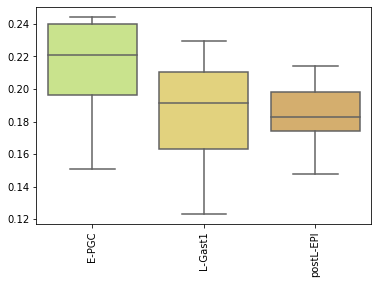

In [101]:
corr_df = pd.DataFrame(corr_list)
corr_df.index =list(set(list(p_ps.obs['annotation'])))
corr_df = corr_df.sort_index()
#corr_df.loc['E16']=corr_df.loc['E16']+0.04
corr_df = corr_df.T
#corr_df = corr_df[['E3','E4','E5','E6','E7','E16']]
ax = sns.boxplot(data = corr_df ,palette=["#cff27e","#f2dd6e","#e5b25d","#b87d4b","#523a34",'#3C76AF'])
plot.setp(ax.get_xticklabels(), rotation=90)


In [628]:
dppa5.X.toarray()


array([[0.],
       [0.],
       [0.],
       ...,
       [0.],
       [1.],
       [0.]], dtype=float32)

In [17]:
human.var


ExecuteError: [0]: 
---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
script_4530482418002678350 in <module>
----> human.var
      

NameError: name 'human' is not defined

In [38]:
p_pgc

AnnData object with n_obs × n_vars = 148 × 28
    obs: 'Unnamed: 0', 'stage', 'annotation', 'species', 'cluster'
    uns: 'log1p', 'rank_genes_groups'

In [107]:
#mouse_c = mouse.copy()
m75 = mouse_c[mouse_c.obs['stage']=='E7.25'].copy()
monkey = ad.read_csv('monkey.csv').T
monkey.obs = pd.read_csv('monkey-meta.csv')
#monkey= monkey[monkey.obs['annotation']!='TE and derivatives'].copy()
monkey= monkey[monkey.obs['stage'].isin(['d.p.f.16'])]
sc.pp.log1p(monkey)
monk_gene= pd.read_csv('Genes/gene_symbol_monkey.csv')
monk_gene= monk_gene[monk_gene['MF5Symbol'].isin(monkey.var_names)]
monk_gene = monk_gene.dropna() 

monkey=monkey[:,list(monk_gene['MF5Symbol'])]
monkey.var_names=monk_gene['HsSymbol']
m_pgc = m75[m75.obs['celltype'].isin(['Nascent mesoderm','Epiblast','Primitive Streak'])]
p_pgc = monkey[monkey.obs['annotation'].isin(['L-Gast2','postL-EPI','L-Gast1'])].copy()
p_pgc= p_pgc[p_pgc.obs['stage'].isin(['d.p.f.16'])]

h_pgc = human[human.obs['sub_cluster'].isin(['Nascent Mesoderm','Epiblast','Primitive Streak'])].copy()


/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/scanpy/preprocessing/_simple.py:339: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [108]:
with open('Genes/bmp_signaling.txt', 'r') as f:
    wnt = f.read().splitlines()
#wnt = wnt[2:]
fgfh =['FGF1',
 'FGF2',
 'FGF3',
 'FGF4',
 'FGF5',
 'FGF6',
 'FGF7',
 'FGF8',
 'FGF9',
 'FGF10',
 'FGF11',
 'FGF12',
 'FGF14',
 'FGF16',
 'FGF17',
 'FGF18',
 'FGF20',
 'FGF21',
 'FGF22',
 'FGF23',
 'FGFRL1',
 'FGFBP1',
 'FGFR1OP2',
 'FGFBP3',
 'FGFR1',
 'FGFR2',
 'FGFR3',
 'FGFR4']


In [109]:
#gl = ['FGF2','FGF5','FGF8','FGFR2']
m75 = mouse[mouse.obs['stage']=='E7.25'].copy()
m_pgc = m75[m75.obs['celltype'].isin(['Nascent mesoderm','Epiblast','Primitive Streak'])]
m_pgc.var_names = human.var_names
m_pgc = m_pgc[:,wnt]
p_pgc = p_pgc[:,wnt]
h_pgc = h_pgc[:,wnt]
#m_pgc.var_names = fgfh
#h_pgc.var_names = gl

m_pgc.obs['species']='mouse'
p_pgc.obs['species']='primate'
h_pgc.obs['species']='human'
m_pgc.obs['cluster']=list(m_pgc.obs['celltype'])
p_pgc.obs['cluster']=list(p_pgc.obs['annotation'])
h_pgc.obs['cluster']=list(h_pgc.obs['sub_cluster'])



Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


In [110]:
sc.tl.rank_genes_groups(h_pgc, groupby = 'cluster', method= 'wilcoxon', corr_method='benjamini-hochberg')
sc.tl.rank_genes_groups(m_pgc, groupby = 'cluster', method= 'wilcoxon', corr_method='benjamini-hochberg')
sc.tl.rank_genes_groups(p_pgc, groupby = 'cluster', method= 'wilcoxon', corr_method='benjamini-hochberg')

h_scores = pd.DataFrame(h_pgc.uns['rank_genes_groups']['scores'])
m_scores = pd.DataFrame(m_pgc.uns['rank_genes_groups']['scores'])
p_scores = pd.DataFrame(p_pgc.uns['rank_genes_groups']['scores'])



/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'cluster_id' as categorical
... storing 'sub_cluster' as categorical
... storing 'species' as categorical
... storing 'cluster' as categorical
... storing 'barcode' as categorical
... storing 'stage' as categorical
... storing 'theiler' as categorical
... storing 'cluster' as categorical
... storing 'celltype' as categorical
... storing 'colour' as categorical
... storing 'haem_subclust' as categorical
... storing 'endo_trajectoryName' as categorical
... storing 'endo_gutCluster' as categorical
... storing 'species' as categorical
... storing 'stage' as categorical
... storing 'annotation' as categorical
... storing 'species' as categorical
... storing 'cluster' as categorical


In [112]:
sc.pp.filter_genes(h_pgc,min_cells=10)
sc.pp.filter_genes(m_pgc,min_cells=20)
sc.pp.filter_genes(p_pgc,min_cells=10)


/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [116]:
det=[]
det.append(['human not detected',list(set(wnt).difference(set(h_pgc.var_names)))])
det.append(['mouse not detected',list(set(wnt).difference(set(m_pgc.var_names)))])
det.append(['primate not detected',list(set(wnt).difference(set(p_pgc.var_names)))])
det
pd.DataFrame(det).to_csv('undetected_BMP.csv',sep=',')


---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
script_5229484963900040222 in <module>
      det=[]
----> det.append(['human not detected',sort(list(set(wnt).difference(set(h_pgc.var_names))))])
      det.append(['mouse not detected',list(set(wnt).difference(set(m_pgc.var_names)))])
      det.append(['primate not detected',list(set(wnt).difference(set(p_pgc.var_names)))])
      det

NameError: name 'sort' is not defined


In [60]:
'''gene_h = human[human.obs['cluster_id'].isin(['Nascent Mesoderm','Epiblast','Primitive Streak'])].copy()
from collections import defaultdict
import scipy
m_names= list(gene_h.var_names)
m_coef = []
m_p = []
m_a = []
for i in list(gene_h.var_names):
    #m_names.append(mu[:,i].var_names)
    rho,pval = scipy.stats.spearmanr(gene_h[:,'TBXT'].X,gene_h[:,i].X)
    m_coef.append(rho)
    m_p.append(pval)
    
'''

mcorrdf = pd.DataFrame({'Gene':m_names, 'coef':m_coef,'pval':m_p,})
mcorrdf = mcorrdf.sort_values(by='pval',ascending=True)
#mscorrdf = mcorrdf[mcorrdf['pval']<0.01]
#m_pos = list(mscorrdf[mscorrdf['coef']>0]['Gene'])
pv = list(mcorrdf['pval'])

In [61]:
%get pv 
pv = pv = pv[2:length(pv)]
padj = p.adjust(pv,method="fdr")

In [64]:
%get padj --from R
mcorrdf = mcorrdf.iloc[1:,:]
mcorrdf['FDR']=padj
mscorrdf = mcorrdf[mcorrdf['FDR']<0.01]
mscorrdf = mscorrdf[mscorrdf['coef']>0]
mscorrdf

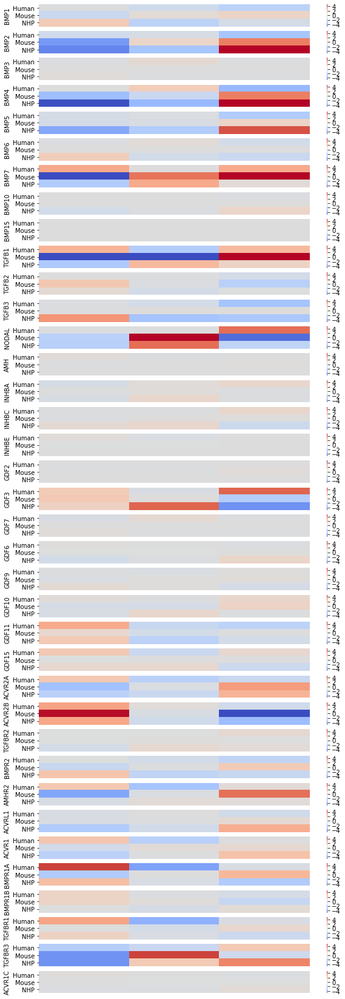

In [111]:
hse = h_scores['Epiblast']
hse.index = pd.DataFrame(h_pgc.uns['rank_genes_groups']['names'])['Epiblast']
hsp = h_scores['Nascent Mesoderm']
hsp.index = pd.DataFrame(h_pgc.uns['rank_genes_groups']['names'])['Nascent Mesoderm']
hspr = h_scores['Primitive Streak']
hspr.index = pd.DataFrame(h_pgc.uns['rank_genes_groups']['names'])['Primitive Streak']

mse = m_scores['Epiblast']
mse.index = pd.DataFrame(m_pgc.uns['rank_genes_groups']['names'])['Epiblast']
msp = m_scores['Nascent mesoderm']
msp.index = pd.DataFrame(m_pgc.uns['rank_genes_groups']['names'])['Nascent mesoderm']
mspr = m_scores['Primitive Streak']
mspr.index = pd.DataFrame(m_pgc.uns['rank_genes_groups']['names'])['Primitive Streak']

pse = p_scores['postL-EPI']
pse.index = pd.DataFrame(p_pgc.uns['rank_genes_groups']['names'])['postL-EPI']
psp = p_scores['L-Gast1']
psp.index = pd.DataFrame(p_pgc.uns['rank_genes_groups']['names'])['L-Gast1']
pse = pse.sort_index()
mse = mse.sort_index()
hse = hse.sort_index()
pspr = p_scores['L-Gast2']
pspr.index = pd.DataFrame(p_pgc.uns['rank_genes_groups']['names'])['L-Gast2']

epis = pd.concat([hse,hspr,psp],axis=1)
epis.columns=['Human Epiblast','Human PS','Human NM']
#epis_t = epis.iloc[:3,:3].values
#epis_t2 = epis.iloc[3:6,0:3].values
#epis.iloc[:3,:3] =epis_t2
#epis.iloc[3:6,:3] = epis_t
psp = psp.sort_index()
msp = msp.sort_index()
hsp = hsp.sort_index()
epip = pd.concat([mse,mspr,msp],axis=1)
epip.columns=['Mouse Epiblast','Mouse PS','Mouse NM']
epipr =  pd.concat([pse,psp,pspr],axis=1)
epipr.columns=['Macaque Epi','Macaque L-Gast1','Macaque L-Gast2}']

z = pd.concat([epis,epip,epipr],axis=1)
import seaborn as sns
fig, axs = plot.subplots(len(wnt), sharex=True, sharey=True,figsize=(10,30))

c = 0
det=[]
for w in wnt:
    tmp = []
    tmp.append(list(epis.loc[w]))
    tmp.append(list(epip.loc[w]))
    tmp.append(list(epipr.loc[w]))
    tmp =pd.DataFrame(tmp)
    tmp.index= ['Human','Mouse','NHP'] 
    tmp.columns = ['Epiblast','PS','NM']

    sns.heatmap(tmp,vmin=-5,vmax=5,cmap='coolwarm',yticklabels=True,ax=axs[c],xticklabels=False)
    ax0label = axs[c].set_ylabel(w)
    
    
    c=c+1
plot.savefig('figures/BMP_signaling.pdf')

In [681]:
epis['Human NM']['WNT5A']=1

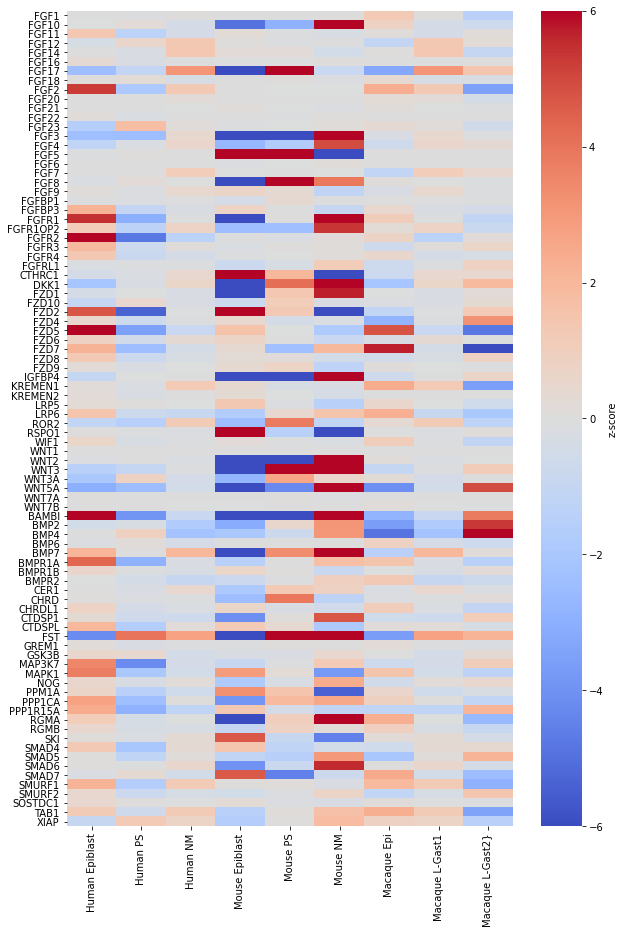

In [81]:
y = pd.concat([fgf,wntt,bmp],axis=0)
fig, ax = plot.subplots(figsize=(10,15))


sns.heatmap(y,cmap='coolwarm',cbar_kws={'label': 'z-score'},vmax=6,vmin=-6,yticklabels=True,ax=ax)


In [5]:
hox_genes = []
for g in human.var_names:
    if(g.startswith('HOX')):
        hox_genes.append(g)
sc.pl.matrixplot(human, groupby='')

,Unnamed: 0,X,X0,X1,cluster_id,sub_cluster,cell_name
0,1,0,12.213498,-0.550328,Hemogenic Endothelial Progenitors,Blood Progenitors,SS.sc7785290
1,2,1,2.404149,-7.389468,Endoderm,DE(P),SS.sc7786612
2,3,2,6.219126,-2.577739,Advanced Mesoderm,Advanced Mesoderm,SS.sc7786605
3,4,3,1.528913,0.412943,Primitive Streak,Primitive Streak,SS.sc7785737
4,5,4,9.373722,4.137366,YS Mesoderm,YS Mesoderm,SS.sc7785398
...,...,...,...,...,...,...,...
1190,1191,1190,0.538678,3.815438,Epiblast,Epiblast,SS.sc7785965
1191,1192,1191,2.494623,1.739064,Primitive Streak,Primitive Streak,SS.sc7788259
1192,1193,1192,0.190426,1.626420,Primitive Streak,Primitive Streak,SS.sc7786123
1193,1194,1193,0.720511,3.806959,Epiblast,Epiblast,SS.sc7786212


In [110]:
import re
tomo = pd.read_csv('gastruloid_genes2.csv',sep=';',decimal=",")
genes = []
for i in range(0,len(tomo['Gene name'])):
    mystr = tomo['Gene name'][i]
    genes.append(re.findall(r'_(.+?)_', mystr))
genes=[item for sublist in genes for item in sublist]
tomo['Gene name']=genes
genes.remove('C9orf47')
genes.remove('SMIM37')
genes.remove('FAM213A')
tomo = tomo[tomo['Gene name'].isin(genes)]
tomo=tomo.sort_values(by='Gene name')
tomo.index = tomo['Gene name']
del(tomo['Unnamed: 23'])
del(tomo['Unnamed: 24'])
del(tomo['Gene name'])



In [63]:
#import scipy
#np.mean(scipy.stats.zscore(gast[gast.obs['cluster_id']==cl].X,axis=0),axis=0))
gast = ad.read_csv("script_heart+gastr/norm_true_data.csv")
gast.obs = pd.read_csv('ori_gast_umap.csv')
gast = gast[:,genes]
sc.pp.filter_genes(gast, min_cells=10)
sc.tl.rank_genes_groups(gast,method='wilcoxon',n_genes=len(gast.var_names),groupby='cluster_id')


/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'cluster_id' as categorical
... storing 'sub_cluster' as categorical


AnnData object with n_obs × n_vars = 1195 × 944
    obs: 'Unnamed: 0', 'X', 'X0', 'X1', 'cluster_id', 'sub_cluster', 'cell_name'
    var: 'n_cells'
    uns: 'rank_genes_groups'

In [111]:
tomo = tomo[tomo.index.isin(list(gast.var_names))]
tomo = tomo.sort_index()
tomo

,050,051,052,053,054,055,056,057,058,059,060,061,062,063,064,065,066,067,068,069,070,071
Gene name,,,,,,,,,,,,,,,,,,,,,,
ABCA1,1.940958,1.714251,0.697870,-0.637436,1.080007,1.320330,1.757545,-0.635778,-0.067269,-0.406197,0.082186,-0.111375,-0.505006,-0.374394,-0.739846,0.465820,-0.748018,-0.641627,-1.215349,-1.211655,-0.586257,-1.178761
ABCG1,-0.750446,-0.750446,-0.750446,-0.750446,-0.615886,-0.359491,-0.638871,-0.638456,-0.605074,-0.510811,-0.634608,-0.533913,0.147317,0.397687,1.538560,1.225313,2.528488,0.646532,2.015826,0.442364,-0.652749,-0.750446
ABI2,0.546914,0.778618,0.320534,2.214567,0.491279,-0.307037,1.448987,0.654336,0.028074,-0.725412,-0.320796,-0.534259,1.014646,-1.131023,-1.538984,-1.195538,-0.636832,0.780476,-0.891166,0.699645,0.007072,-1.704101
ABLIM1,-0.494932,-0.663511,-0.957047,-0.934894,-0.765100,-1.115887,-0.658466,-0.552334,-0.687210,-0.508361,-0.518638,-0.374828,0.522370,1.497348,0.723818,2.900239,-0.547296,0.955204,0.930864,-0.118873,1.094588,0.272946
ACAT2,-1.065717,-0.768116,-1.092577,-0.935716,-1.129408,-0.902306,-0.351588,-0.559369,-0.590425,0.419915,0.494451,0.662341,1.317197,0.895156,1.444774,1.154559,2.301692,0.471511,0.386264,-0.989549,-0.888974,-0.274116
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZNF70,2.310719,-0.950775,0.980436,-1.887146,-0.647615,-0.086895,-0.345446,0.952258,0.794393,-0.783685,-0.286143,-0.890064,-0.234766,-0.926953,-0.885637,-0.588399,1.592912,0.685009,-0.070098,-0.056725,1.264249,0.060373
ZNF704,-0.898004,-0.389011,-0.793260,-0.975425,-0.745199,-0.349367,0.042536,-0.157410,0.564464,0.582560,0.931492,1.840104,2.219712,2.113528,0.376455,-0.196357,-0.957349,-0.786326,-0.971611,-0.694242,-0.269211,-0.488076
ZNF836,0.850337,2.810907,-0.740747,-0.740747,0.434065,-0.740747,0.233389,-0.740747,0.211044,1.351455,0.270612,0.204390,0.825357,-0.740747,-0.740747,-0.740747,-0.740747,1.697406,-0.740747,-0.740747,-0.740747,-0.740747


In [98]:
#scores = pd.DataFrame(gast.uns['rank_genes_groups']['scores'])
#names =pd.DataFrame(gast.uns['rank_genes_groups']['names'])
epi = scores['Epiblast']
epi.index=names['Epiblast']
list(tomo['054'])

[1.08000726,
 -0.615886159,
 0.49127877200000003,
 -0.765099882,
 -1.129407972,
 -0.210941696,
 -0.44867727700000004,
 -0.361539096,
 2.04626872,
 0.20862752199999998,
 0.357676049,
 -0.559521443,
 0.29165232,
 -0.481281561,
 -0.509959741,
 0.129655374,
 -0.350691769,
 -0.151298454,
 -0.710297462,
 -0.11145532699999999,
 0.025226152,
 -0.9072074090000001,
 -1.1718791240000002,
 -0.391270378,
 -0.605325635,
 1.391630088,
 0.84660103,
 0.147339535,
 0.7960331709999999,
 -0.364067315,
 -0.600145037,
 0.637674913,
 0.254992617,
 -0.812932793,
 -0.314214443,
 -0.47204631,
 -0.222926286,
 -0.922744256,
 -0.8651203670000001,
 -1.0887021159999999,
 0.7397863490000001,
 0.5897389479999999,
 -0.29611696,
 -0.435609168,
 -0.482895626,
 -0.38268719700000003,
 -0.318315803,
 0.479600013,
 -0.21989639600000002,
 -0.8613304759999999,
 0.855701842,
 -0.43317848299999995,
 -1.135736397,
 -0.075045377,
 -0.280946497,
 1.121751012,
 -1.149321214,
 0.002295801,
 1.951155617,
 0.95222371,
 1.442560839,
 -0

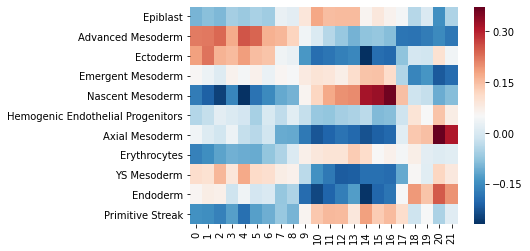

In [113]:
import scipy
corr_df = []
def return_z(cl):
    hse =pd.DataFrame(scipy.stats.zscore(np.mean(gast[gast.obs['cluster_id']==cl].to_df(),axis=0)))
    hse.index = list(gast.var_names)
    return hse
ep = []
for c in set(gast.obs['cluster_id']):
    g = scores[c]
    g.index= names[c]
    g=g.sort_index()
    corr_z = []
    
    for i in list(tomo):

        tm = tomo[i]
        corr = scipy.stats.pearsonr(list(g),list(tm))
        rho, pp = corr
        corr_z.append(rho)
    corr_df.append(corr_z)
    ep.append(c)
corr_df = pd.DataFrame(corr_df)
corr_df.index =ep
sns.heatmap(corr_df,cmap='RdBu_r')


In [8]:
import seaborn as sns
for index , row in pval.iterrows():
    for i in range(0,len(row)):
        if(row[i])>0.05:
            corr_df.loc[index][i]=0
fig, axs = plot.subplots(figsize=(15,10))

corr_df=corr_df.reindex(['Epiblast','Ectoderm','Primitive Streak','Nascent Mesoderm','Emergent Mesoderm','Advanced Mesoderm',
                        'YS Mesoderm', 'Axial Mesoderm','Endoderm', 'Hemogenic Endothelial Progenitors','Erythrocytes'])
sns.heatmap(corr_df,vmin=0,cmap='Reds')

plot.savefig('Gastruloid_rep1.pdf')


---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
script_6531523162482579470 in <module>
      import seaborn as sns
----> for index , row in pval.iterrows():
          for i in range(0,len(row)):
              if(row[i])>0.05:
                  corr_df.loc[index][i]=0

NameError: name 'pval' is not defined


In [631]:
n= 500
heatm=[]
corr_df = []

import random
for c in set(gast.obs['cluster_id']):
    g =return_z(c)
    g=g.sort_index()
    corr_z = []
    for j in range(23):
         
        l=[]
        for k in range(0, n):
            mark2=tomo.values.flatten()
            random.shuffle(mark2)
            mark2 = list(mark2)
            mark2=pd.DataFrame(list(map(lambda x: mark2[23*x:(x+1)*23], range (1020))))
            z = list(mark2[j])
            #z = z[:200]
            corr = scipy.stats.pearsonr(list(g),z)
            rho, pval = corr
            corr_z.append(rho)
        #corr_df.append(corr_z)        
    heatm.append(corr_z)
df = pd.DataFrame(heatm)


In [ ]:
fcc = df.groupby(np.arange(len(df.columns))//n, axis=1).mean()
new_list = [list(data_list)[i:i+n] for i in range(0, len(data_list), n)]

In [ ]:
data_list = list(df.iloc[0])
[list(data_list)[i:i+n] for i in range(0, len(data_list), n)][0]

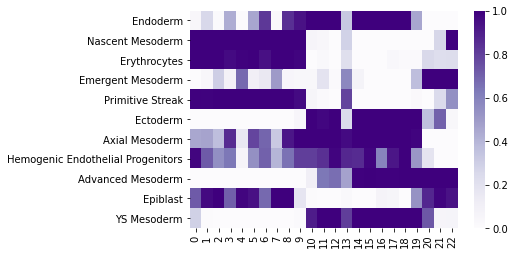

In [634]:
pval = []
fc =df
fc.index= corr_df.index
for index , row in fc.iterrows():
    data_list = list(row)
    true = list(corr_df.loc[index])
    new_list = [list(data_list)[i:i+n] for i in range(0, len(data_list), n)]
    pv = []
    for j in range(0,len(new_list)):
        pv.append(len([x for x in new_list[j] if x >= true[j]])/len(new_list[j])) 
    pval.append(pv)
pval = pd.DataFrame(pval)
pval.index=fc.index
sns.heatmap(pval, cmap='Purples')


In [4]:
human = ad.read_csv("script_heart+gastr/norm_true_data.csv")


In [5]:
mu = m_epi.concatenate(m_ps,m_mes)
cmp = pd.read_excel('gene_lists/mouse_comp.xlsx')
human = ad.read_csv("script_heart+gastr/norm_true_data.csv")
human.obs = pd.read_csv('ori_gast_umap.csv')
results_gam_m  = list(mu.var_names)

 

In [6]:
%get results_gam_m 
convertMouseGeneList <- function(x){
 
require("biomaRt")
human = useMart("ensembl", dataset = "hsapiens_gene_ensembl")
mouse = useMart("ensembl", dataset = "mmusculus_gene_ensembl")
 
genesV2 = getLDS(attributes = c("mgi_symbol"), filters = "mgi_symbol", values = x , mart = mouse, attributesL = c("hgnc_symbol"), martL = human, uniqueRows=T)
humanx <-genesV2[, 2]
mousex <-genesV2[, 1]
# Print the first 6 genes found to the screen
print(head(humanx))
return(list(v1=humanx,v2=mousex))

}
hmg<-convertMouseGeneList(results_gam_m)

Loading required package: biomaRt



[1] "MT-ND6"  "MT-ND3"  "MT-ND2"  "MT-CYB"  "MT-ND5"  "MT-ATP8"


In [7]:
%get hmg --from R
hgenes = hmg['v1']
mgenes = hmg['v2']
hmg = pd.DataFrame(hmg)
hmg = hmg.drop_duplicates(subset='v1',keep='first')
hmg = hmg.drop_duplicates(subset='v2',keep='first')
#human = ad.read_csv('heman.csv')
#ery = ad.read_csv('epi.csv')
#human.obs['cl'] = list(pd.read_csv('heman_cl.csv')['sub_cl'])
#human = ad.read_csv("script_heart+gastr/norm_true_data.csv")
#human.obs = pd.read_csv('ori_gast_umap.csv')

mouse = mu.copy()
hmg = hmg[hmg['v2'].isin(mouse.var_names)]
hmg = hmg[hmg['v1'].isin(human.var_names)]

hgenes = hmg['v1']
mgenes = hmg['v2']
human = human[:,hgenes]
mouse = mouse[:,mgenes]
emb4 = mouse.to_df()
emb2 = human.to_df()
m_cluster = list(mouse.obs['celltype'])
h_cluster = list(human.obs['sub_cluster'])

In [70]:
#mouse.var_names = human.var_names
#ouse = mouse[:, list(cmp['Gene'])]
#human = human[:, list(cmp['Gene'])]
cmp =pd.read_excel('mouse_compo.xlsx')
cmp =cmp[cmp['Gene'].isin(set(cmp['Gene']).intersection(set(list(human.var_names))))]
human=human[human.obs['cluster_id'].isin(['Epiblast','Primitive Streak','Nascent Mesoderm'])].copy()
mouse.var_names=human.var_names
mdf = mouse.to_df()
mdf = mdf.mean(axis=0)
m_ave=[]

for g in list(cmp['Gene']):
    m_ave.append(mdf[g])
cmp['m_average_expr.']=m_ave
m_ave=[]
hdf = human.to_df()
hdf = hdf.mean(axis=0)
for g in list(cmp['Gene']):
    m_ave.append(hdf[g])
cmp['h_average_expr.']=m_ave
cmp=cmp.drop('cluster mouse',axis=1)
cmp=cmp.drop('cluster hum',axis=1)
#tt = cmp[cmp['trend mouse']!='flat']
#tt=tt[cmp['trend hum']!='flat']
#cmp= cmp.dropna()
#tt.to_excel('gene_lists/mouse_comp.xlsx')
cmp

/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


,Unnamed: 0,Gene,DE (h)?,DE (m)?,signaling?,trend hum,trend mouse,FDR hum,FDR mouse,m_average_expr.,h_average_expr.
0,0,PLCE1,no,yes,yes,NaN,down,NaN,9.858414e-15,0.026657,0.108437
1,1,ZNF385A,no,yes,no,NaN,down,NaN,4.570605e-15,0.109630,0.121687
2,2,WIPF3,no,yes,no,NaN,down,NaN,3.456611e-34,0.141931,0.432367
3,3,CHCHD4,no,yes,no,NaN,flat,NaN,7.029671e-26,0.000600,1.770920
4,4,SLC25A22,no,yes,no,NaN,flat,NaN,4.049792e-13,0.302474,0.230050
...,...,...,...,...,...,...,...,...,...,...,...
8167,8167,BHLHE40,yes,no,no,up,NaN,0.000045,NaN,0.003362,0.526579
8168,8168,CCDC160,yes,yes,no,flat,down,0.000070,7.074644e-17,0.081652,1.865782
8170,8170,CDC45,yes,no,no,down,NaN,0.001426,NaN,0.338617,1.414505
8172,8172,DENND2A,no,yes,no,NaN,flat,NaN,1.164494e-04,0.086215,0.105849


In [76]:
#cmp=cmp[-cmp['Gene'].isin(list(cmp[(cmp['trend hum'].isnull()) & (cmp['trend mouse']=='flat')]['Gene']))]
#cmp =cmp[-cmp['Gene'].isin(list(cmp[(cmp['trend mouse'].isnull()) & (cmp['trend hum']=='flat')]['Gene']))]
cmp.to_excel('gene_lists/mouse_comp.xlsx')

In [104]:
human = ad.read_csv("script_heart+gastr/norm_true_data.csv")
human.obs = pd.read_csv('ori_gast_umap.csv')


/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'cluster_id' as categorical
... storing 'sub_cluster' as categorical


In [122]:
human = human[human.obs['sub_cluster'].isin(['Primitive Streak','PGC'])]


/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [133]:
sc.tl.rank_genes_groups(human,groupby='sub_cluster',method='wilcoxon',corr_method='benjamini-hochberg',n_genes=100)

pd.DataFrame(human.uns['rank_genes_groups']['pvals_adj'])

/Users/elmirmahammadov/miniconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


,PGC,Primitive Streak
0,0.044234,0.044234
1,0.044234,0.044234
2,0.044234,0.044234
3,0.044234,0.044234
4,0.044234,0.046785
...,...,...
95,0.448665,0.392339
96,0.448665,0.392339
97,0.448665,0.392339
98,0.452048,0.402143


In [ ]:
adata
adata_3000 , HVGs 
adata_3000.raw = adata

